In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import regex as reg
from mpl_toolkits.basemap import Basemap
from networkx.algorithms.community import greedy_modularity_communities
from matplotlib.colors import ListedColormap
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
from wordcloud import WordCloud

In [3]:
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()

Loading the data about universities:

In [4]:
universities = pd.read_pickle('data/Universities.pkl')
universities.head()

,file,name,domain,email,author_order,country,Lat,Lon
0,import2018_371,University of Colorado at Boulder,colorado.edu,rebecca.swanson@colorado.edu,0,United States,40.006667,-105.267222
1,import2018_371,University of Colorado at Boulder,colorado.edu,leighanna.hinojosa@colorado.edu,1,United States,40.006667,-105.267222
2,import2018_371,University of Colorado at Boulder,colorado.edu,joseph.polman@colorado.edu,2,United States,40.006667,-105.267222
3,import2018_417,Indiana University at Bloomington,indiana.edu,huang220@indiana.edu,0,United States,39.167222,-86.521389
4,import2018_417,Indiana University at Bloomington,gmail.com,agomoll90@gmail.com,1,United States,39.167222,-86.521389


In [5]:
universities.rename(columns={'email': 'mail'}, inplace=True)

In [6]:
universities['merge_index'] = universities.apply(lambda x: x['file']+str(x['author_order']), axis=1)

metadata = pd.read_csv('data/Parsed_metadata.csv', index_col=0, parse_dates=['accessioned', 'available', 'issued'])
metadata.issued = metadata.issued.map(lambda x: x.year)
metadata['merge_index'] = metadata.apply(lambda x: x['file']+str(x['author_order']), axis=1)
associations = pd.merge(universities, metadata, on='merge_index')

In [7]:
associations.rename(columns={'file_x': 'file'}, inplace=True)

# Looking at co authorship, taking into consideration country and inst.

We use the associations frame again to build a co-authorship graph based on people with attributes country and institution

In [8]:
print(associations.columns)
#we can drop one of the file columns
(associations.file != associations.file_y).sum()

Index(['file', 'name', 'domain', 'mail', 'author_order_x', 'country', 'Lat',
       'Lon', 'merge_index', 'file_y', 'subject', 'iso', 'uri', 'type',
       'publisher', 'title', 'issued', 'accessioned', 'citation', 'available',
       'abstract', 'long_name', 'author_order_y', 'shortend_names',
       'identifier'],
      dtype='object')


0

In [9]:
associations['subject'] = associations.subject.map(lambda x: [reg.sub("'|,|\[|\]", '', y).lower().strip() for y in x.split(',')])

In [10]:
del associations['file_y']

In [11]:
associations = associations[associations.country.notna()]

In [12]:
self_merge = pd.merge(associations, associations, on='file')
self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]

#edges = self_merge[['long_name_x', 'long_name_y', 'issued_x']].copy()

nodes = associations[~associations.long_name.duplicated()].reset_index(drop=True).reset_index()
name_index = nodes.long_name.to_dict()
name_index = {v: k for k, v in name_index.items()}

In [13]:
self_merge['source'] = self_merge.long_name_x.map(name_index)
self_merge['target'] = self_merge.long_name_y.map(name_index)

In [14]:
def get_adjacency(nodes, edges):
    n_nodes = len(nodes)
    adjacency = np.zeros((n_nodes, n_nodes), dtype=int)

    for idx, row in edges.iterrows():
        i, j = int(row.source), int(row.target)
        adjacency[i, j] += 1

    return adjacency

In [15]:
adjacency = get_adjacency(nodes, self_merge)
graph = nx.from_numpy_array(adjacency)

Adding attributes to the graph:

In [16]:
edge_dict = {}
keyword_dict = {}
for i, row in self_merge.iterrows():
    edge_dict[(row['source'], row['target'])] =  row['issued_x']
    keyword_dict[(row['source'], row['target'])] =  row['subject_x']

In [17]:
nx.set_edge_attributes(graph, edge_dict, name='year')
nx.set_edge_attributes(graph, keyword_dict, name='keywords')
nx.set_node_attributes(graph, nodes.country.to_dict(), name='country')
nx.set_node_attributes(graph, nodes.name.to_dict(), name='uni')
mapping = nodes.long_name.to_dict()
H=nx.relabel_nodes(graph,mapping)

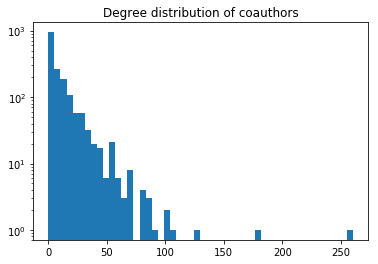

In [18]:
plt.title('Degree distribution of coauthors')
plt.hist(adjacency.sum(axis=1), bins=50, log=True)
plt.show()

This is a simple drawing of our network: we see that there is a large core communit, and many many smaller comminitues of co authors. We will look more into the main community

In [19]:
#pos = nx.drawing.layout.kamada_kawai_layout(graph)

In [20]:
#pos = nx.layout.spring_layout(graph)
pos = nx.layout.fruchterman_reingold_layout(graph)

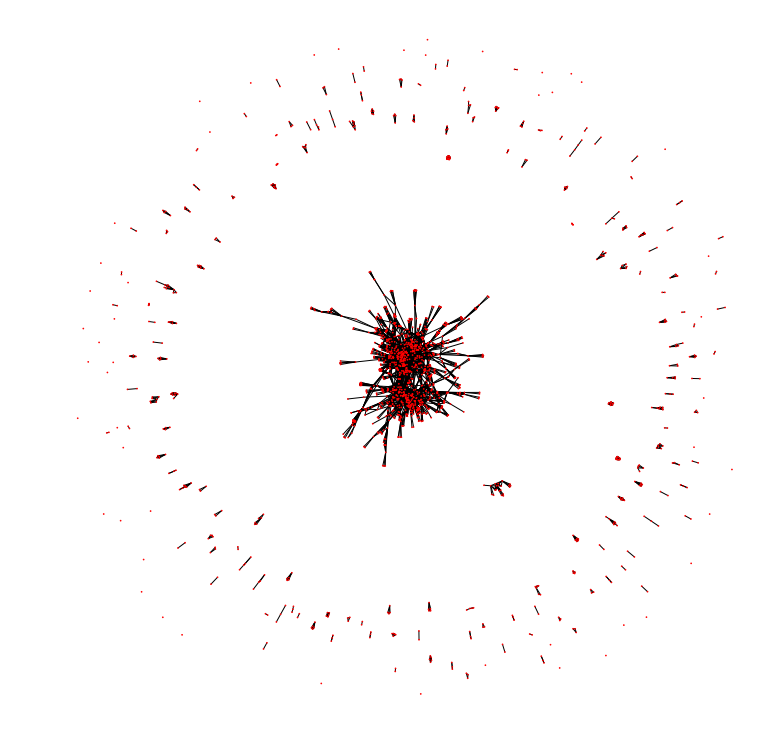

In [21]:
plt.figure(figsize=(10, 10))
nx.draw(graph, pos=pos, node_size=[0.5,0.5])

In [22]:
embedding = nodes.apply(lambda x: [x.Lon, x.Lat], axis=1)

In [23]:
weight = nx.get_edge_attributes(graph, 'weight')

We focus in on the different components:

In [24]:
#get components
largest_cc = max(nx.connected_components(graph), key=len)

The total number of components is:

In [25]:
nx.number_connected_components(graph)

209

In [26]:
print(f'the largest component contains : {len(largest_cc)} people')

the largest component contains : 1114 people


Use centrality to highlight nodes that function as "bridges" between people

In [27]:
centrality = nx.betweenness_centrality(graph.subgraph(largest_cc))

In [28]:
np.quantile(np.array(list(centrality.values())), 0.9)

0.008964230944335065

In [29]:
lables = nodes['long_name'].to_dict()

lables = { key: lables[key] for (key, value) in centrality.items() if value > 0.03}
lables

{2: 'Polman, Joseph L',
 21: 'Fischer, Frank',
 37: 'Moher, Tom',
 38: 'Slotta, James D.',
 47: 'Peppler, Kylie A',
 63: 'Puntambekar, Sadhana',
 72: 'Shapiro, R. Benjamin',
 94: 'Oshima, Jun',
 97: 'Zhang, Jianwei',
 98: 'Chen, Mei-Hwa',
 116: 'Yoon, Susan A.',
 120: 'Danish, Joshua A.',
 132: 'Clarke, Sherice',
 146: 'Kali, Yael',
 154: 'Bielaczyc, Katerine',
 155: 'Kapur, Manu',
 179: 'Rummel, Nikol',
 240: 'Jona, Kemi',
 255: 'Tan, Michael',
 256: 'Sandoval, William A.',
 282: 'van Aalst, Jan',
 318: 'Rosé, Carolyn',
 319: 'kafai, yasmin',
 320: 'Tissenbaum, Mike',
 322: 'Telhan, Orkan',
 347: 'Nathan, Mitchell',
 417: 'Dillenbourg, Pierre',
 432: 'Hmelo-Silver, Cindy E.',
 461: 'Chan, Carol K.K.',
 548: 'Hall, Rogers',
 595: 'Penuel, William',
 605: 'Bang, Megan',
 1152: 'Lund, Kristine',
 1153: 'Radinsky, Josh',
 1252: 'Barma, Sylvie',
 1366: 'Laferrière, Thérèse',
 1444: 'Kirschner, Paul'}

In [30]:
node_size = np.array(list(centrality.values()))*5000

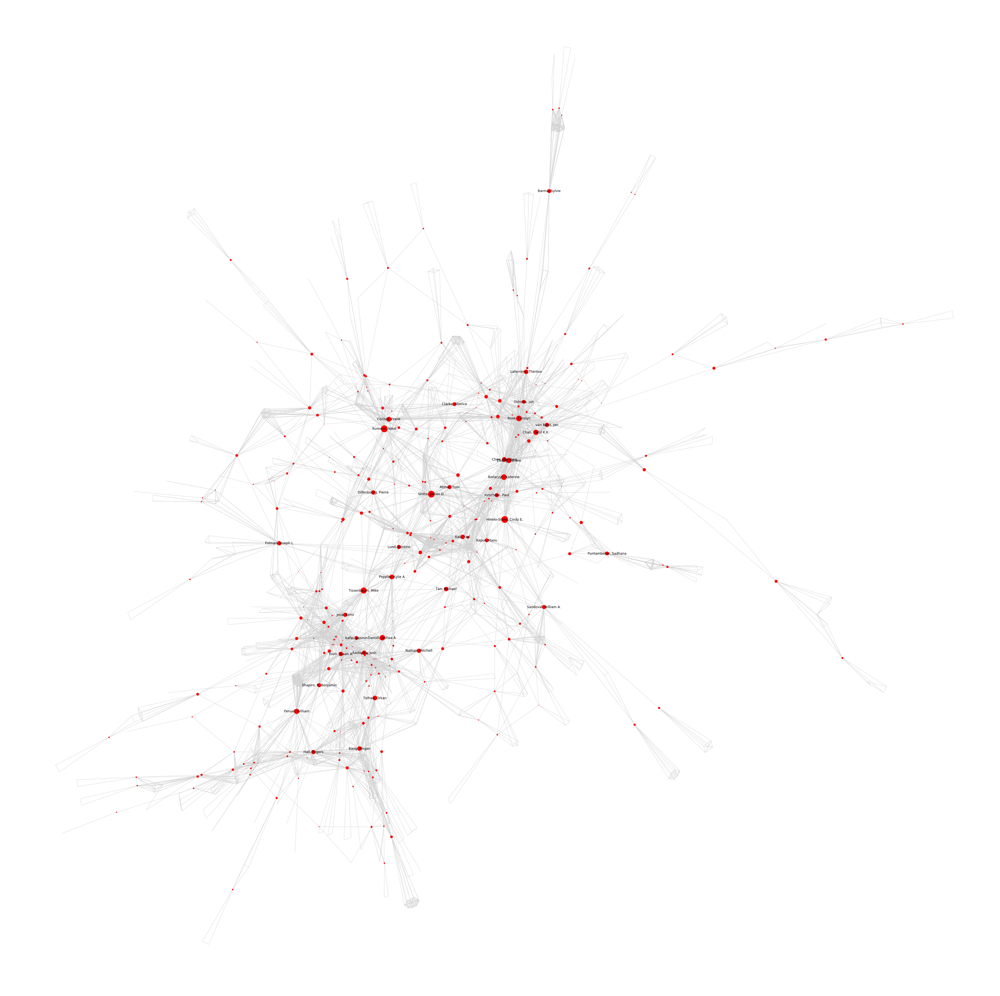

In [31]:
plt.figure(figsize=(50, 50))
nx.draw(graph.subgraph(largest_cc), node_size=node_size, edge_color='lightgray', labels=lables)

**Same graph for people who collaborated at least on 3 papers:**

e.g. we look at frequent collaborators (also forming a main component)

In [32]:
G = nx.Graph(((source, target, attr) for source, target, attr in graph.edges(data=True) if attr['weight'] > 1))
nx.set_node_attributes(G, nodes.country.to_dict(), name='country')
nx.set_node_attributes(G, nodes.name.to_dict(), name='uni')
nx.set_node_attributes(G, nodes.long_name.to_dict(), name='author')

largest_ccs = [i for i in nx.connected_components(G) if len(i) > 9 and len(i) < 20]
len(largest_ccs)

4

In [33]:
[len(i) for i in largest_ccs]

[19, 12, 10, 13]

In [34]:
lc = max(nx.connected_components(G), key=len)

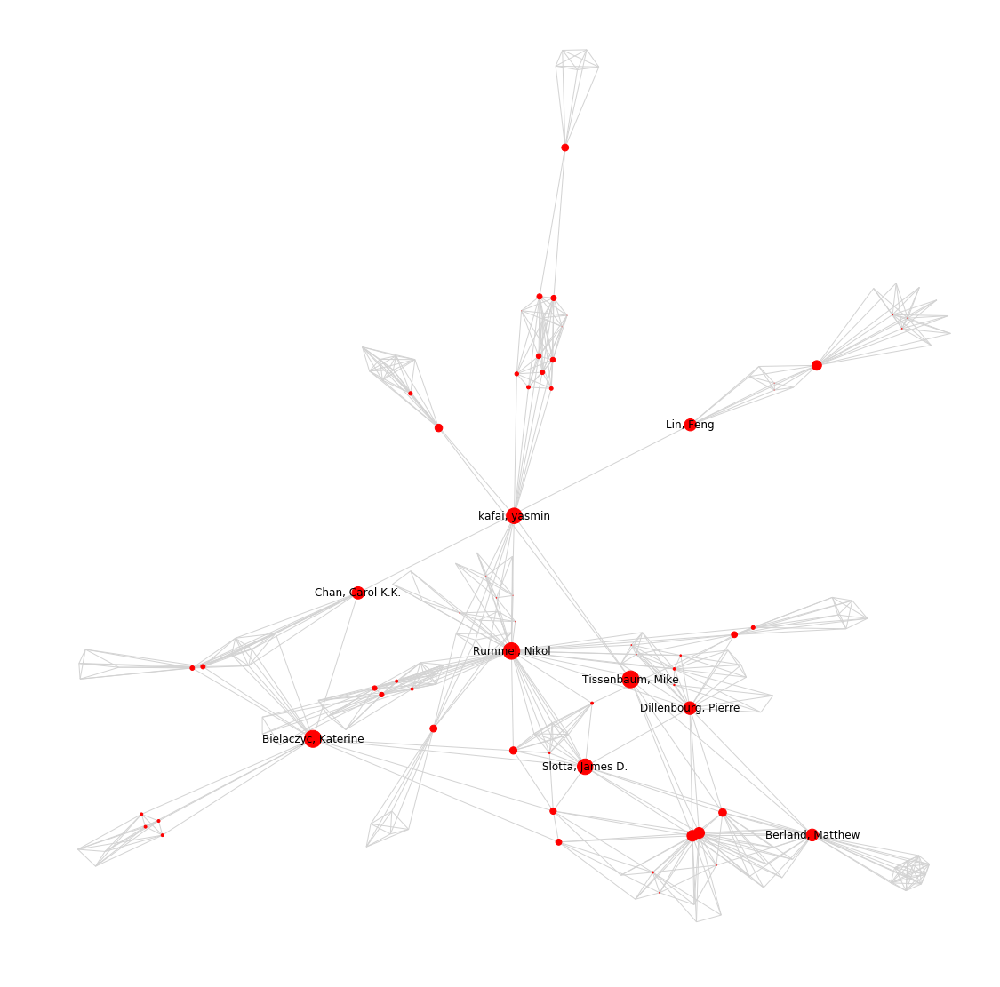

In [35]:
core = nx.k_core(G.subgraph(lc), k=4)
core = core.subgraph(max(nx.connected_components(core), key=len))
node_size = pd.Series(nx.betweenness_centrality(core))
labels = nx.get_node_attributes(core.subgraph(node_size[node_size.quantile(0.95) < node_size].index), 'author')
plt.figure(figsize=(15, 15))
pos= nx.layout.spring_layout(core)
nx.draw(core,pos=pos, edge_color='lightgray', node_size=node_size*1000, span=0.01, labels=labels)

In [36]:
palette = sns.color_palette(palette='tab20', n_colors=20).as_hex()

In [37]:
import matplotlib.patches as mpatches

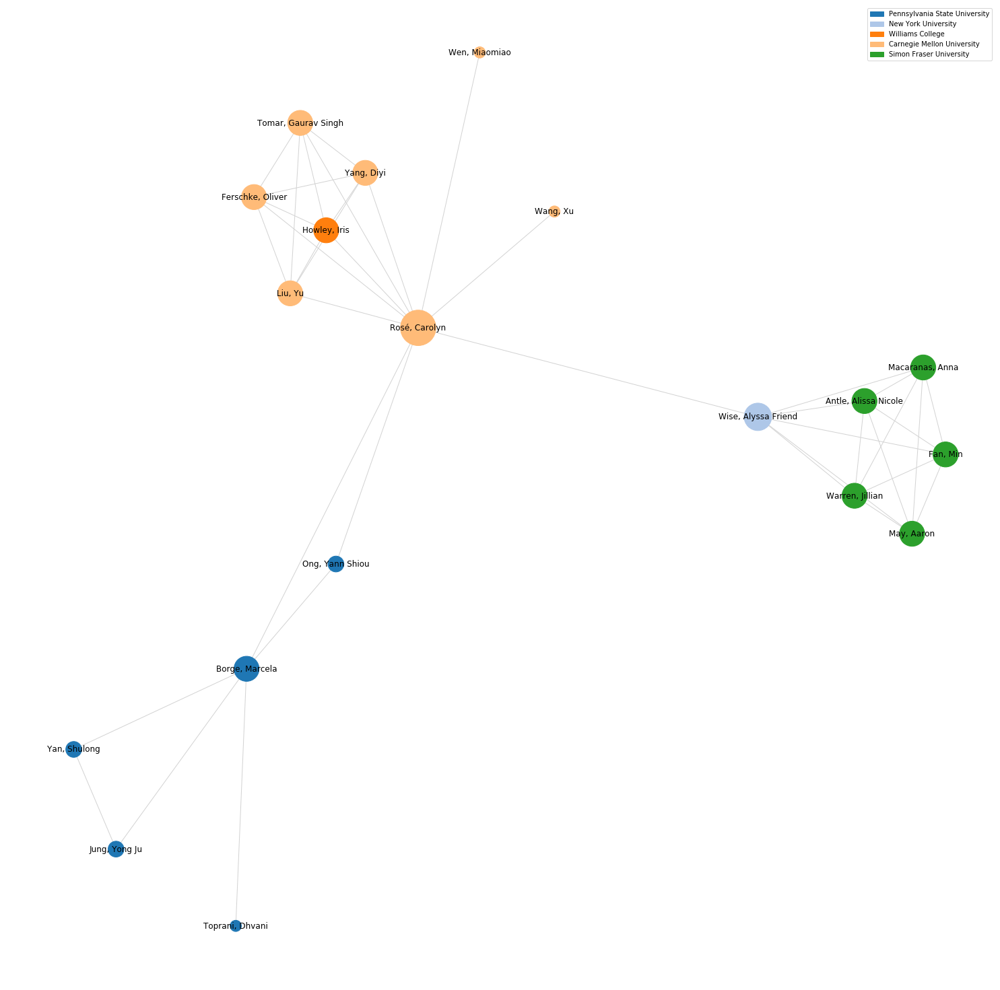

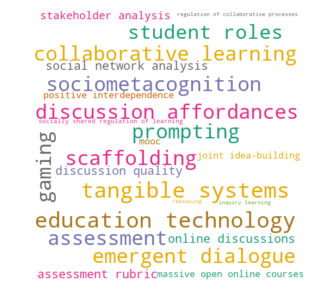

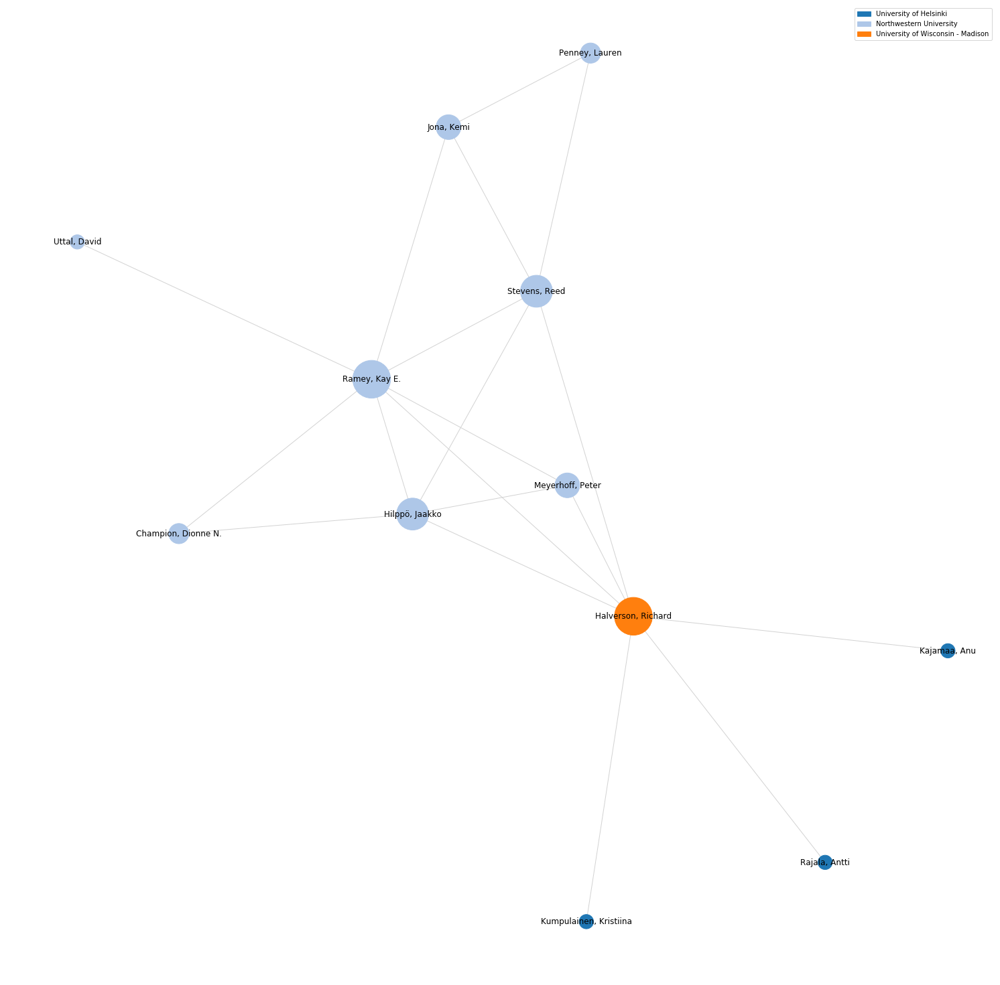

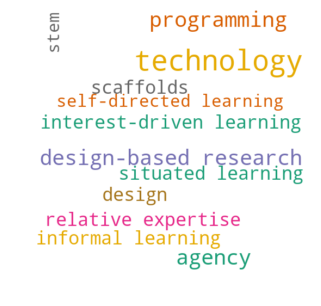

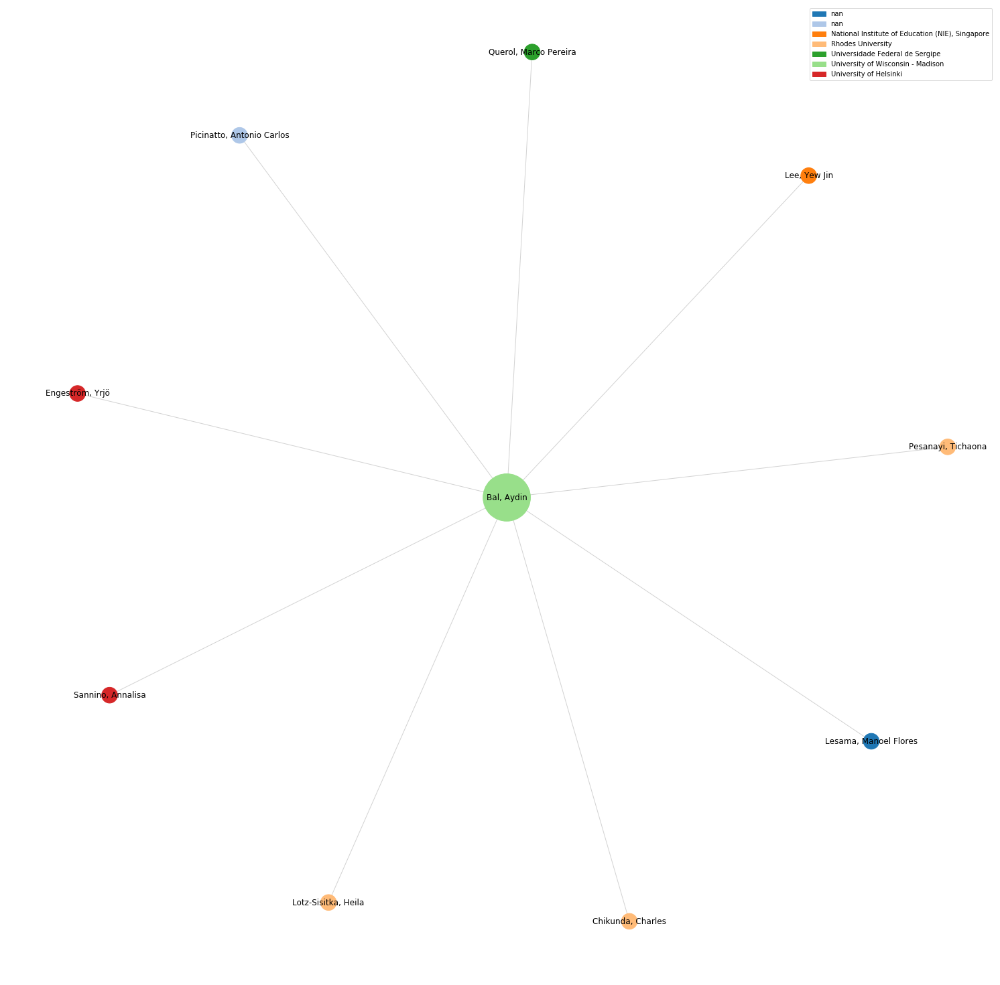

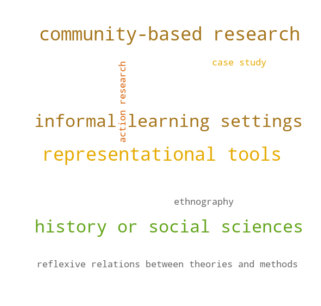

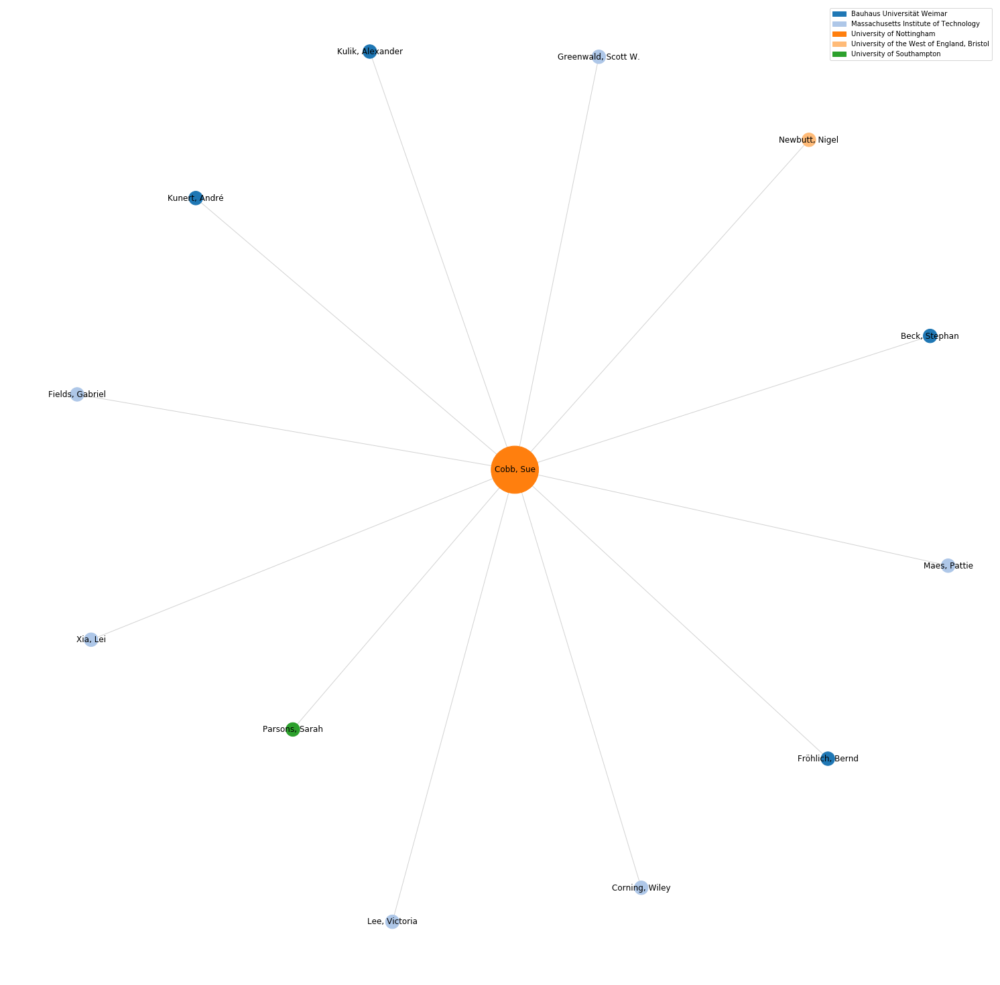

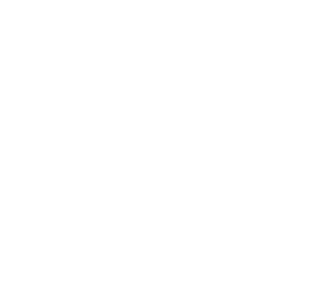

In [38]:
for largest_cc_strong in largest_ccs:
    
    helper = list(set(nx.get_node_attributes(
        G.subgraph(largest_cc_strong), 'uni').values()))
    node_color = [palette[helper.index(i)] for i in nx.get_node_attributes(G.subgraph(largest_cc_strong), 'uni').values()]
    
    plt.figure(figsize=(20, 20))
    
    node_size = np.array(list(nx.degree_centrality(G.subgraph(largest_cc_strong)).values()))

    lables = nodes.iloc[list(largest_cc_strong)]['long_name'].to_dict()
    nx.draw_spring(G.subgraph(largest_cc_strong), node_size=node_size*5000, labels=lables, edge_color='lightgray',
                  node_color=node_color)
    #draw legend
    legend = []
    for ind, name in enumerate(helper):
        legend.append(mpatches.Patch(color=palette[ind], label=name))
    plt.legend(handles=legend)
    
    plt.show()
    keywords = pd.Series(list(nx.get_edge_attributes(G.subgraph(largest_cc_strong), 'keywords').values()))
    keywords = pd.Series([i for j in keywords[
        ~keywords.map(lambda x : ''.join(x)).duplicated()].tolist() for i in j]).value_counts()

    wordcloud = WordCloud(background_color="white", contour_width=3, width=500, height=500, max_words=keywords.shape[0], 
                      min_font_size=1, colormap="Dark2")
    wordcloud.generate_from_frequencies(keywords.to_dict())
    plt.figure( figsize=(5,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.savefig('wordcloud.png', bbox_inches='tight')
    plt.show()

Drawing it in a geographical embedding:

#### Collaboration in the graph over the years:

In [39]:
edges = self_merge[['long_name_x', 'long_name_y', 'issued_x']].drop_duplicates()
counts = edges.groupby(['long_name_x', 'long_name_y']).count()
counts.issued_x.value_counts()

1    12412
2      622
3      110
4       16
Name: issued_x, dtype: int64

In [40]:
edge_dict = {}
keyword_dict = {}
for i, row in counts[counts.issued_x > 1].reset_index().iterrows():
    keywords = self_merge[(self_merge.long_name_x == row.long_name_x) & 
                     (self_merge.long_name_y == row.long_name_y)].subject_x
    keywords = [i for j in keywords[
        ~keywords.map(lambda x : ''.join(x)).duplicated()].tolist() for i in j if len(i) > 0]
    keyword_dict[(row.long_name_x, row.long_name_y)] = keywords

In [41]:
G = nx.from_pandas_edgelist(counts[counts.issued_x > 1].reset_index(), 
                        source='long_name_x', target='long_name_y', edge_attr=['issued_x'])
nx.set_node_attributes(G, nodes.set_index('long_name').country.to_dict(), name='country')
nx.set_node_attributes(G, nodes.set_index('long_name').name.to_dict(), name='uni')
nx.set_edge_attributes(G, keyword_dict, name='keywords')

_______
subgraph 0
________


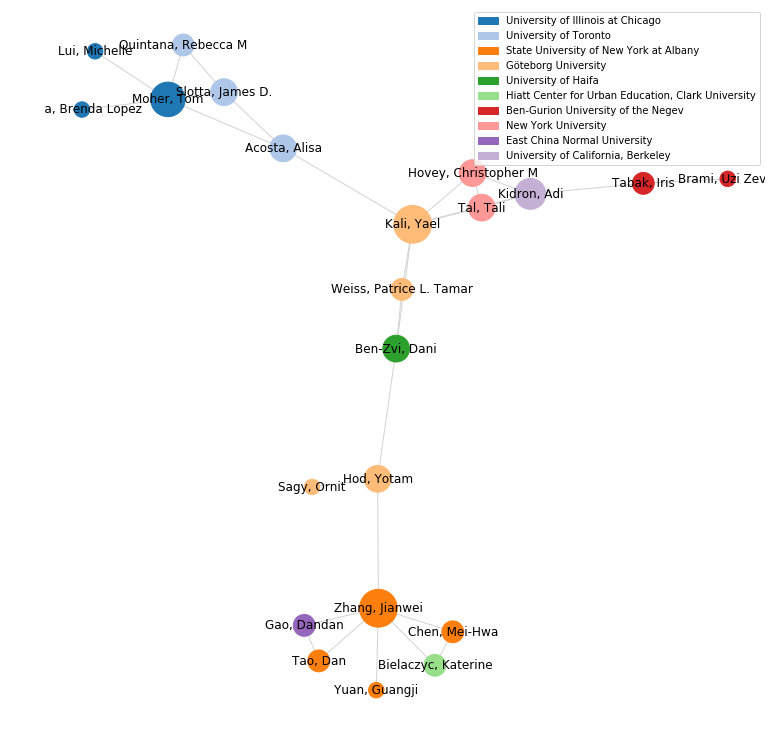

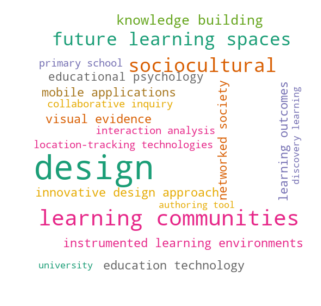

_______
subgraph 1
________


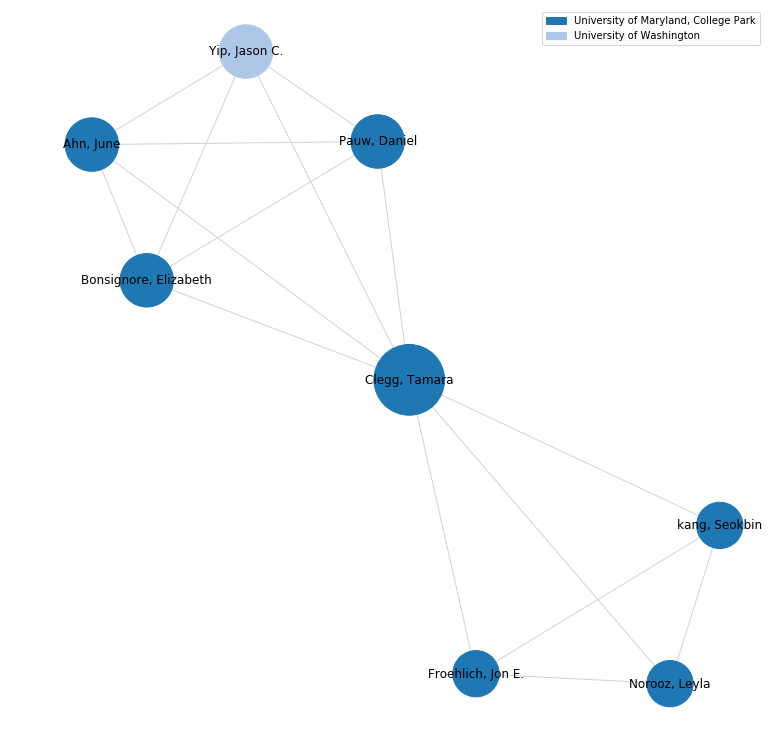

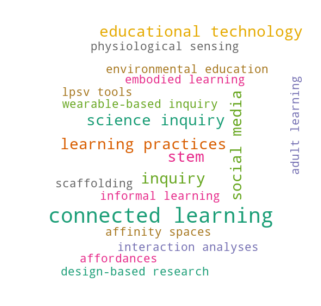

_______
subgraph 2
________


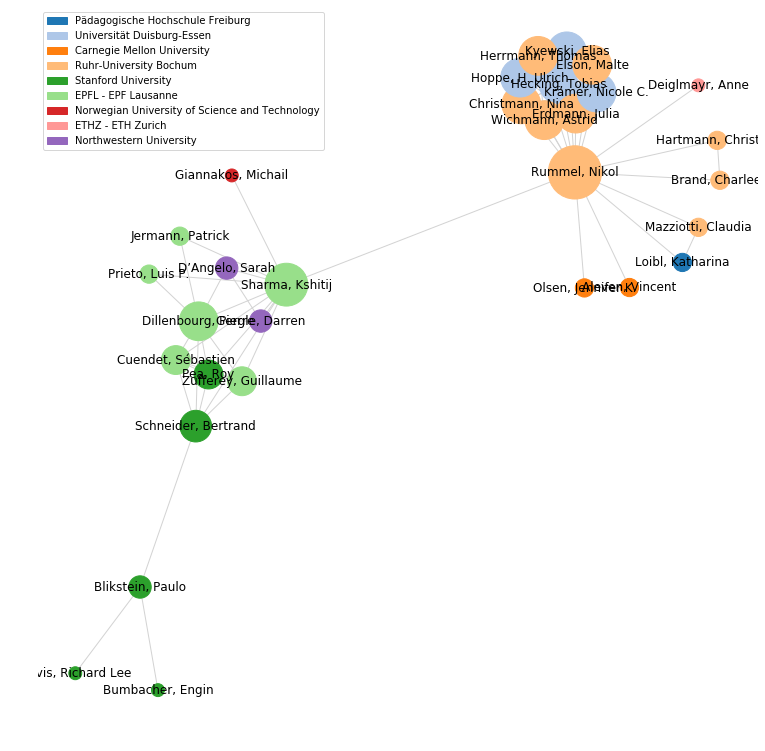

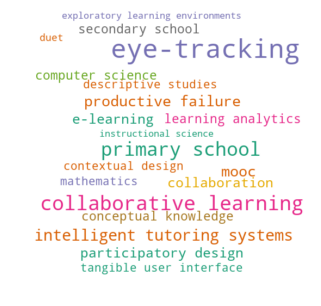

_______
subgraph 3
________


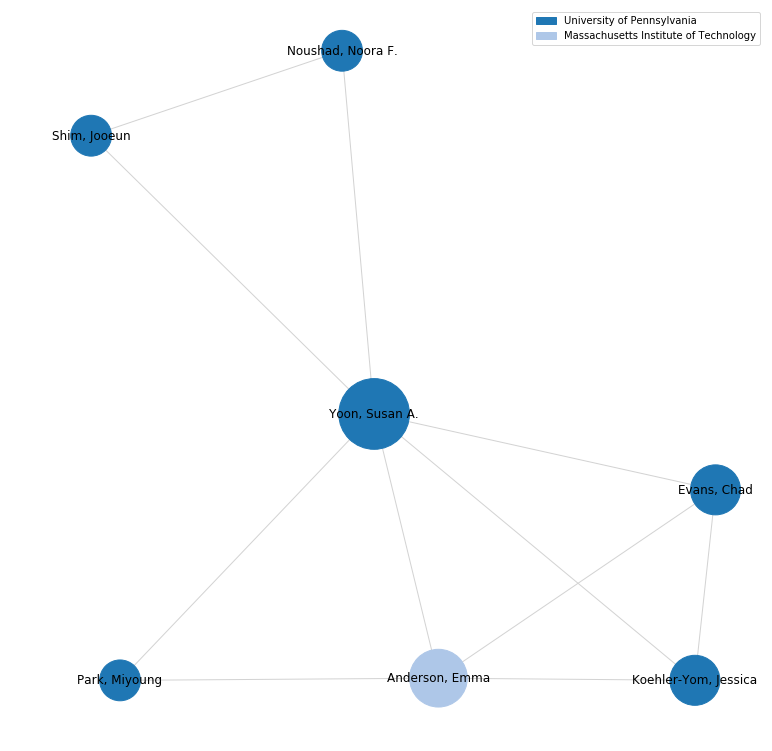

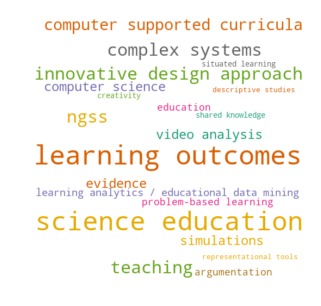

_______
subgraph 4
________


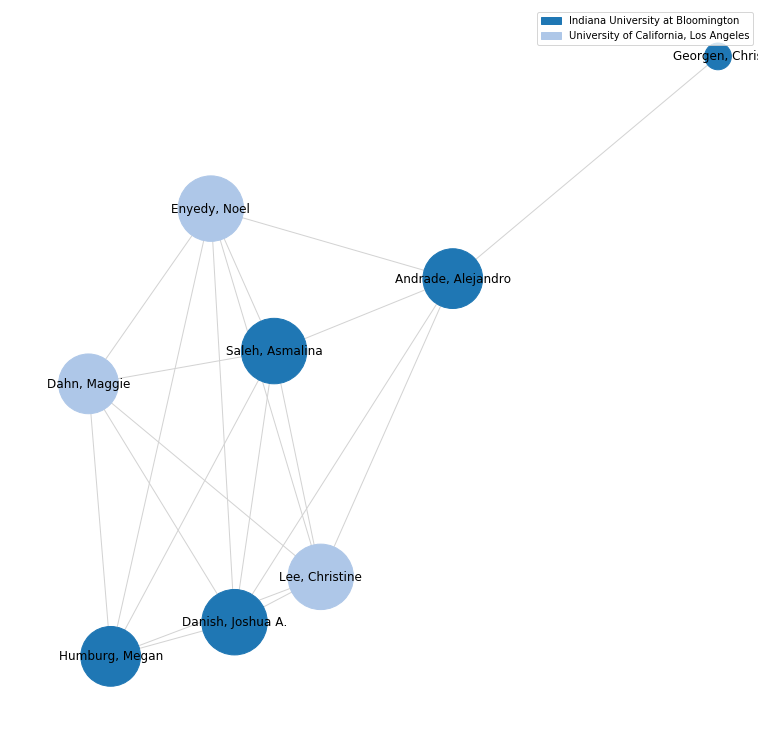

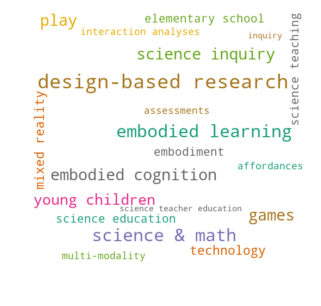

_______
subgraph 5
________


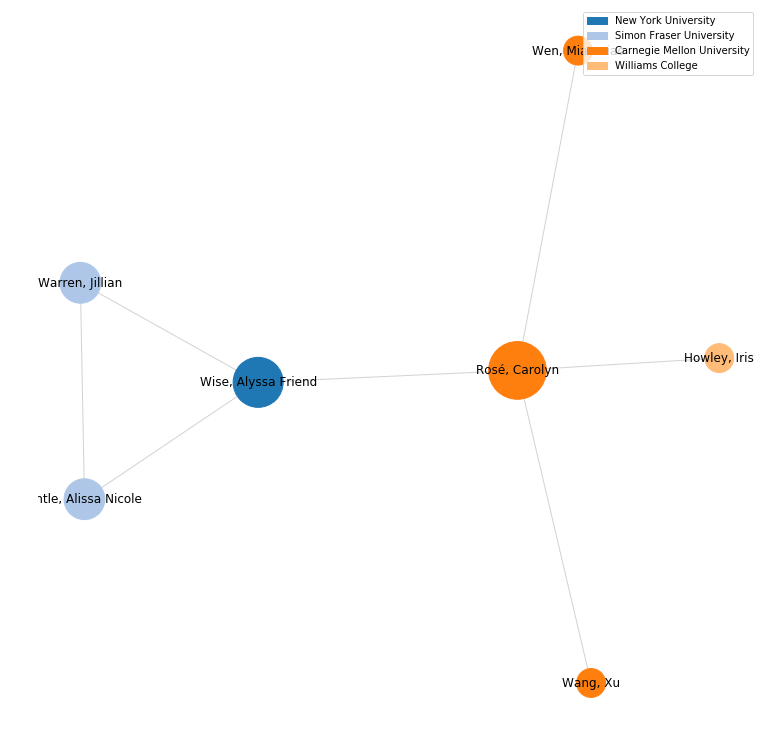

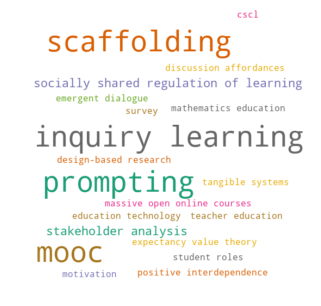

_______
subgraph 6
________


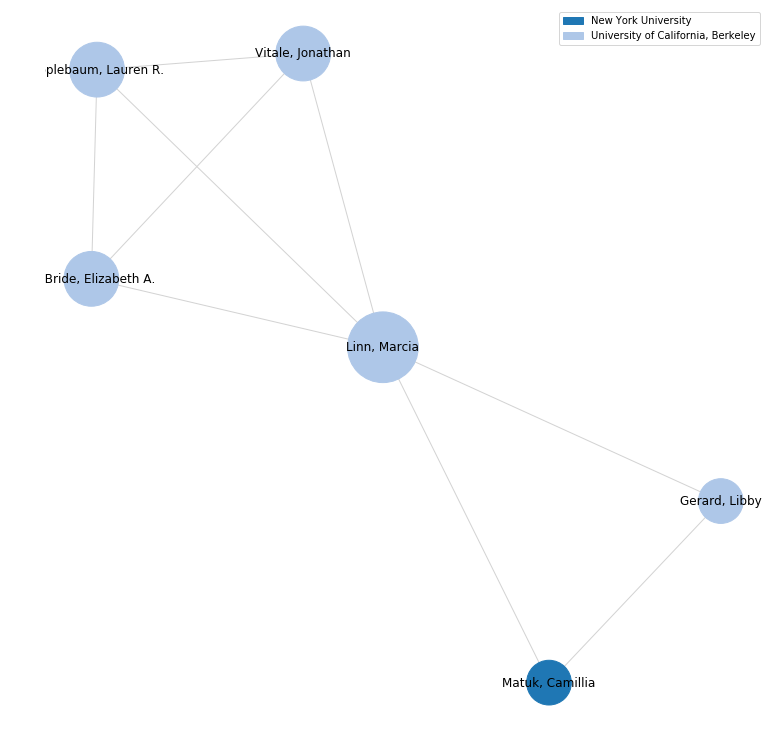

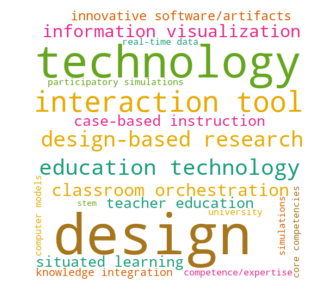

_______
subgraph 7
________


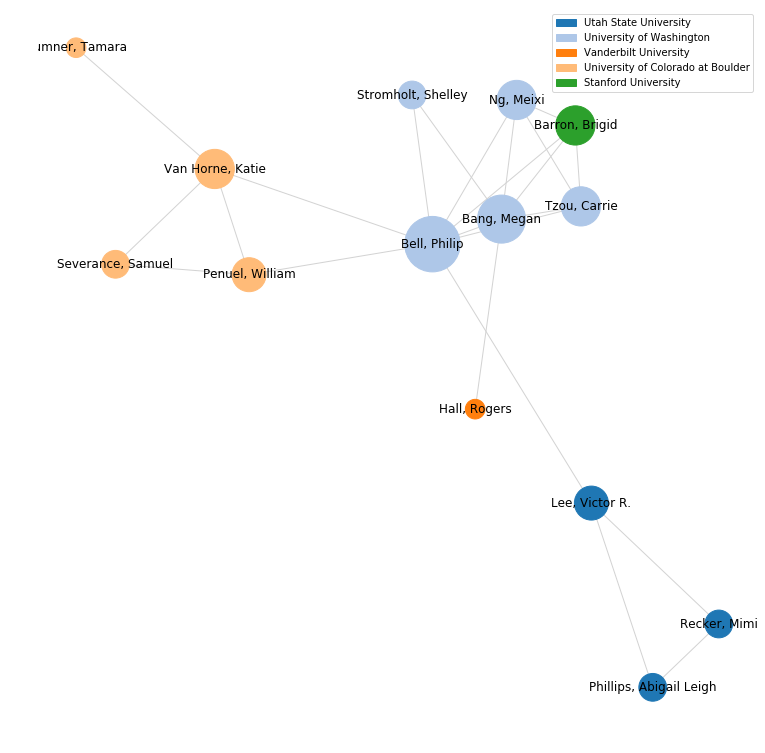

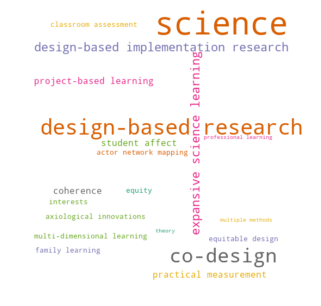

_______
subgraph 8
________


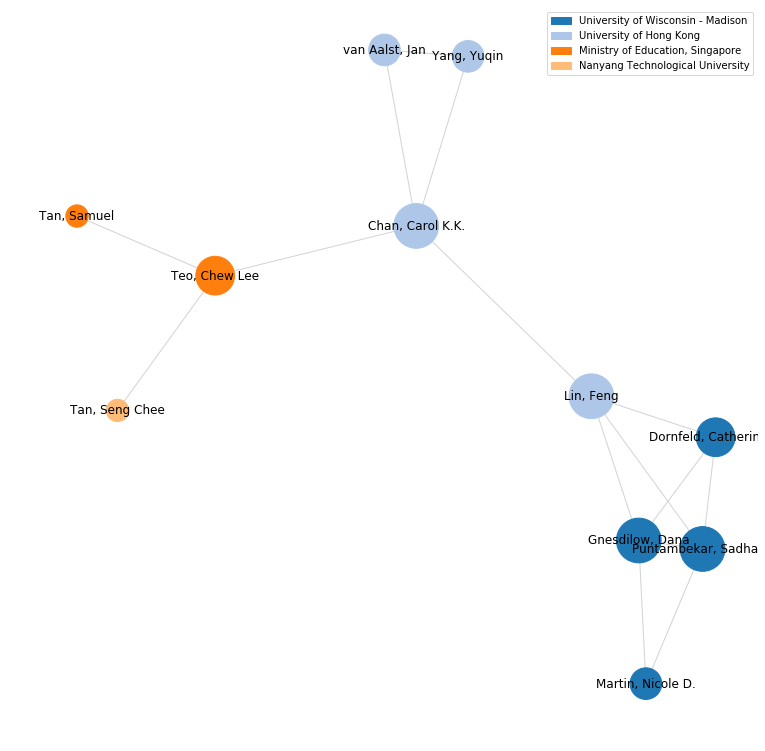

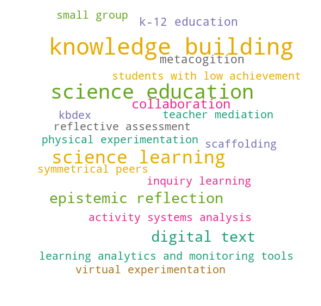

_______
subgraph 9
________


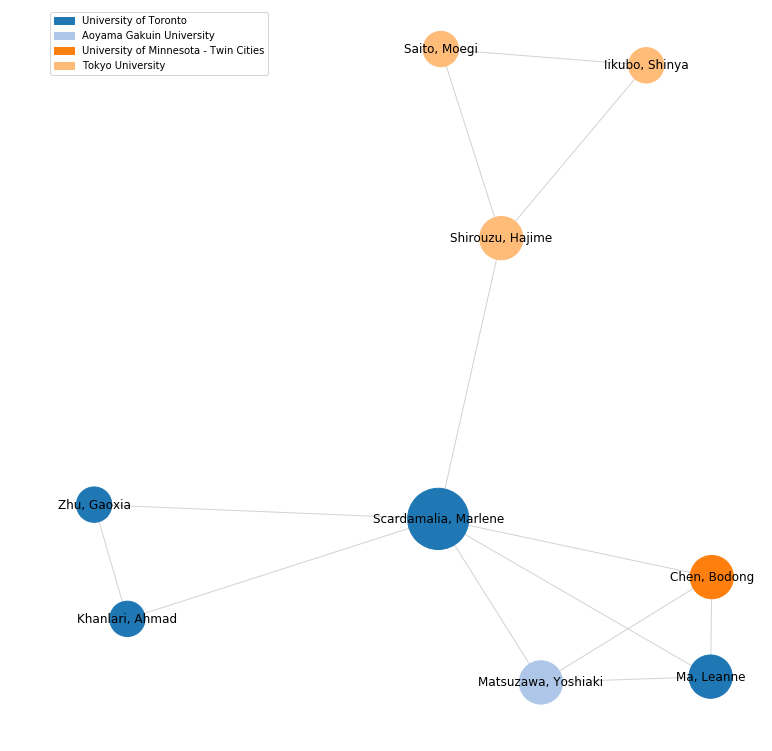

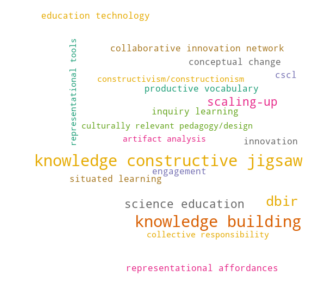

_______
subgraph 10
________


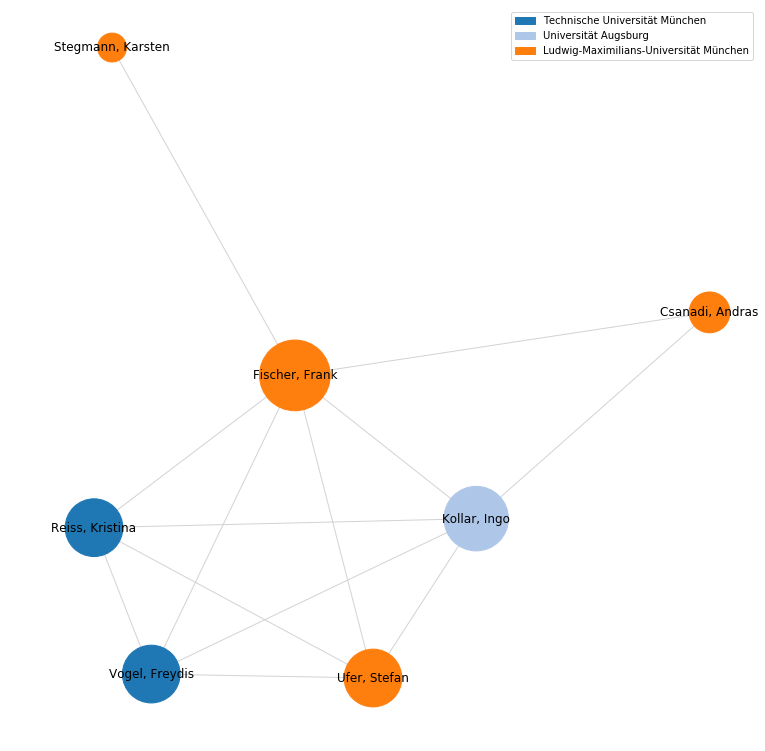

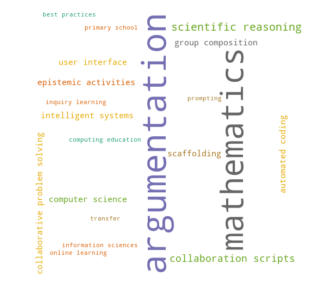

_______
subgraph 11
________


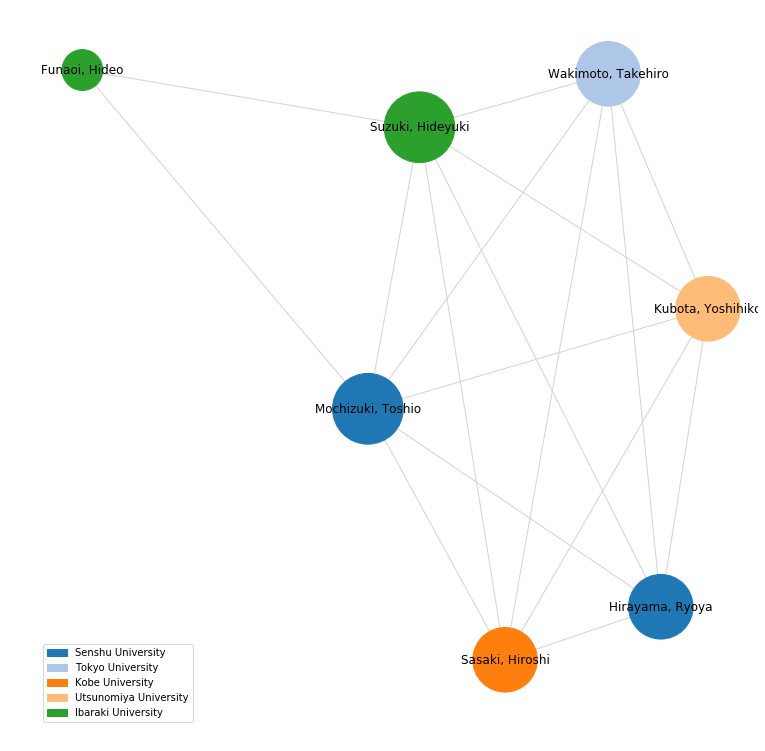

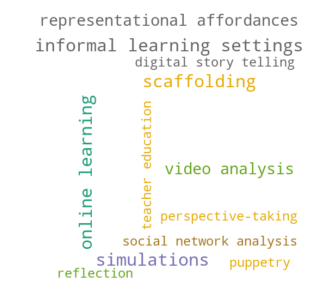

_______
subgraph 12
________


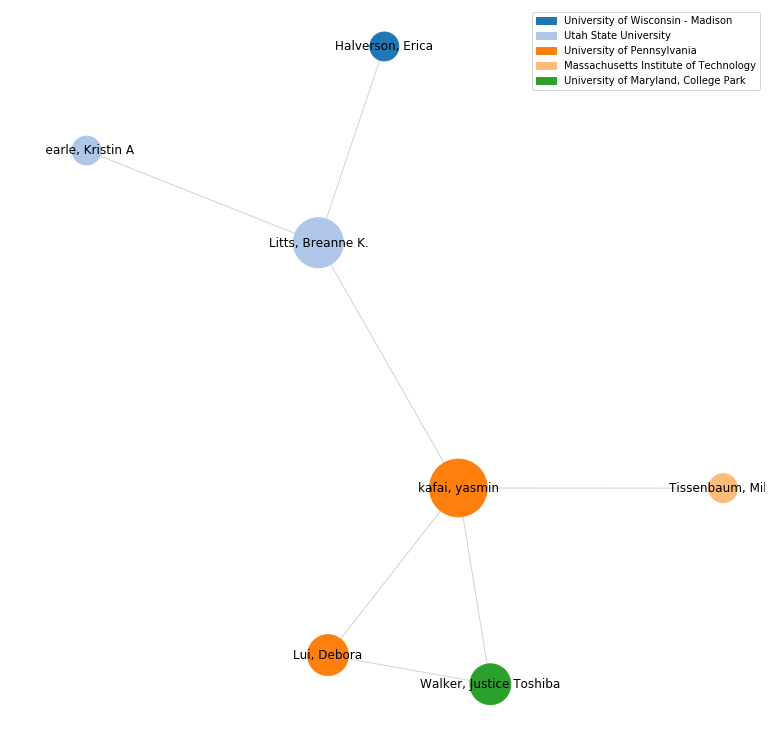

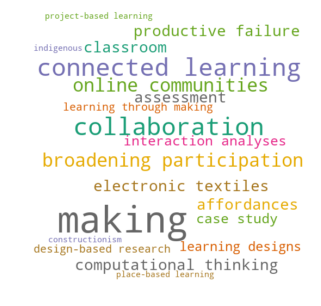

_______
subgraph 13
________


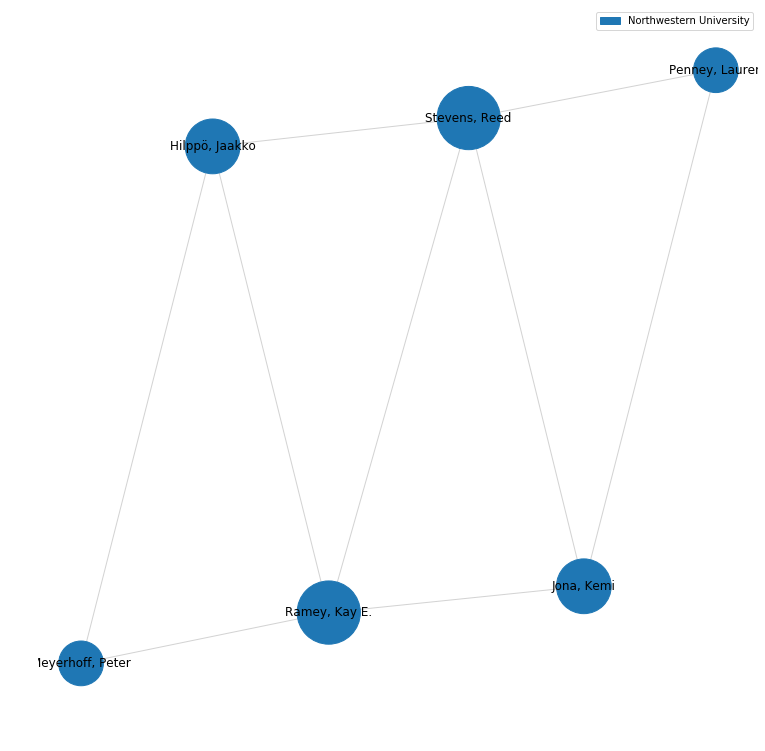

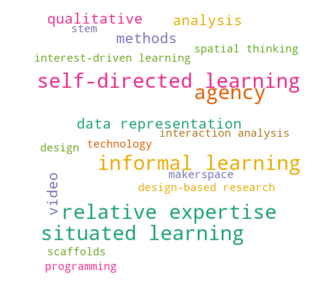

In [42]:
largest_cc_strong = [i for i in list(nx.connected_components(G)) if len(i) > 5]

for i, subgraph in enumerate(largest_cc_strong):
    
    print(f'_______\nsubgraph {i}\n________')
    data = associations[associations.long_name.isin(list(subgraph)) & ~associations.long_name.duplicated()]
    G_ = G.subgraph(subgraph)
    
    helper = list(data.name.unique())
    node_size = np.array(list(nx.degree_centrality(G_).values()))
    node_color = [palette[helper.index(i)] for i in nx.get_node_attributes(G_, 'uni').values()]
    
    plt.figure(figsize=(10, 10))
    
    nx.draw_spring(G_, node_size=node_size*5000, with_labels=True, edge_color='lightgray', 
                   node_color = node_color, cmap=plt.cm.Set1)

    legend = []
    for ind, name in enumerate(helper):
        legend.append(mpatches.Patch(color=palette[ind], label=name))
    plt.legend(handles=legend)
    plt.show()
    
    keywords = pd.Series(list(nx.get_edge_attributes(G.subgraph(subgraph), 'keywords').values()))
    keywords = pd.Series([i for j in keywords[
        ~keywords.map(lambda x : ''.join(x)).duplicated()].tolist() for i in j]).value_counts()
    wordcloud = WordCloud(background_color="white", contour_width=3, width=500, height=500, max_words=20, 
                      min_font_size=1, colormap="Dark2")
    wordcloud.generate_from_frequencies(keywords.to_dict())
    plt.figure( figsize=(5,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.savefig('wordcloud.png', bbox_inches='tight')
    plt.show()

## collaboration over one years

In [43]:
G = nx.Graph(((source, target, attr) for source, target, attr in graph.edges(data=True) 
              if attr['year'] == 2016 and attr['weight'] > 3))

nx.set_node_attributes(G, nodes.country.to_dict(), name='country')
nx.set_node_attributes(G, nodes.name.to_dict(), name='uni')
nx.set_edge_attributes(G, keyword_dict, name='keywords')
G = nx.relabel_nodes(G,mapping)

largest_cc_strong = max(nx.connected_components(G), key=len)
len(largest_cc_strong)

14

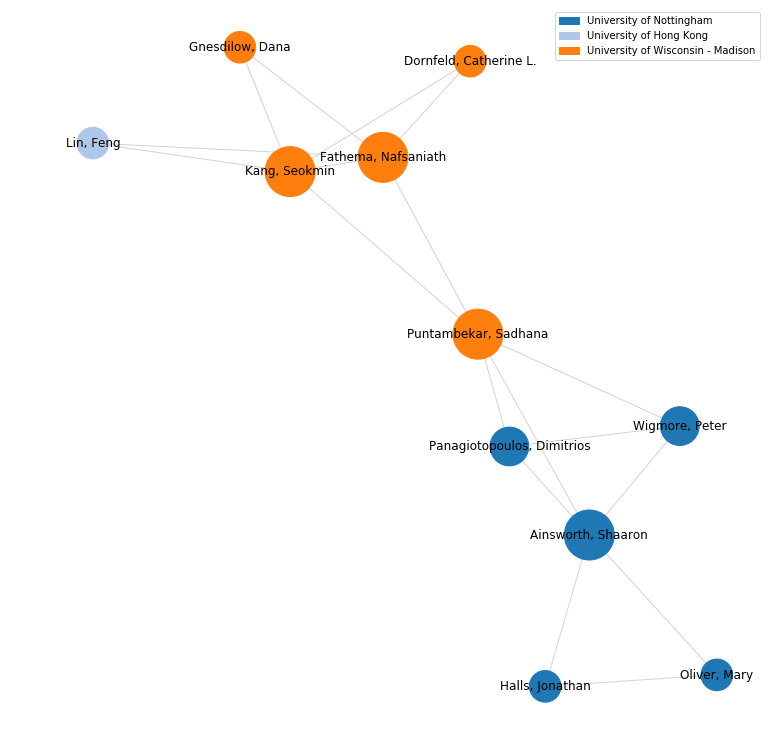

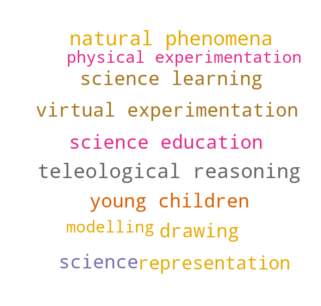

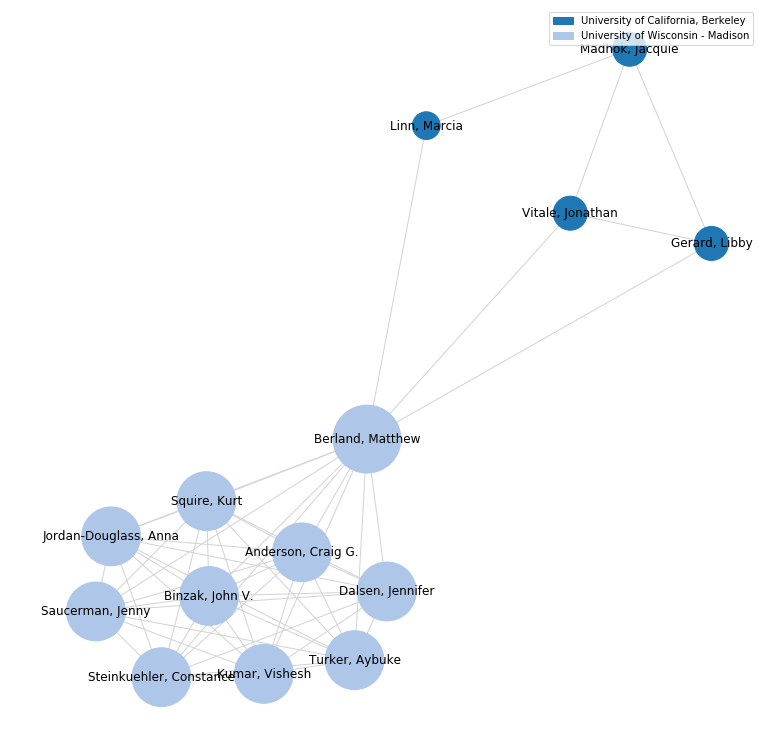

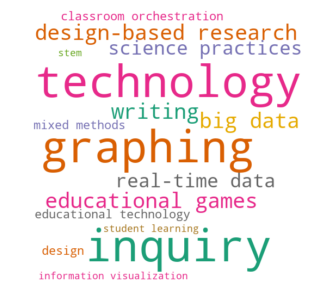

In [44]:
largest_cc_strong = [i for i in list(nx.connected_components(G)) if len(i) > 6]

for subgraph in largest_cc_strong:
    data = associations[associations.long_name.isin(list(subgraph)) & ~associations.long_name.duplicated()]
    G_ = G.subgraph(subgraph)
    
    helper = list(set(nx.get_node_attributes(
        G.subgraph(subgraph), 'uni').values()))
    node_size = np.array(list(nx.degree_centrality(G_).values()))
    node_color = [palette[helper.index(i)] for i in nx.get_node_attributes(G_, 'uni').values()]
    
    plt.figure(figsize=(10, 10))
    
    nx.draw_spring(G_, node_size=node_size*5000, with_labels=True, edge_color='lightgray', 
                   node_color = node_color, cmap=plt.cm.Set1)

    legend = []
    for ind, name in enumerate(helper):
        legend.append(mpatches.Patch(color=palette[ind], label=name))
    plt.legend(handles=legend)
    plt.show()
    
    keywords = pd.Series(list(nx.get_edge_attributes(G.subgraph(subgraph), 'keywords').values()))
    keywords = pd.Series([i for j in keywords[
        ~keywords.map(lambda x : ''.join(x)).duplicated()].tolist() for i in j]).value_counts()
    wordcloud = WordCloud(background_color="white", contour_width=3, width=500, height=500, max_words=20, 
                      min_font_size=1, colormap="Dark2")
    wordcloud.generate_from_frequencies(keywords.to_dict())
    plt.figure( figsize=(5,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.savefig('wordcloud.png', bbox_inches='tight')
    plt.show()

### Who colaborates the most:

We can easely find the people who worked with the most other people:
(counting repeat collaboration)

In [45]:
nodes['collabs_weighted'] = adjacency.sum(axis=1)
nodes.sort_values(by='collabs_weighted', ascending=False)[['long_name', 'country', 'name', 'collabs_weighted']].head(10)

,long_name,country,name,collabs_weighted
179,"Rummel, Nikol",Germany,Ruhr-University Bochum,260
235,"Linn, Marcia",United States,"University of California, Berkeley",178
63,"Puntambekar, Sadhana",United States,University of Wisconsin - Madison,126
368,"Gerard, Libby",United States,"University of California, Berkeley",104
233,"Vitale, Jonathan",United States,"University of California, Berkeley",100
154,"Bielaczyc, Katerine",United States,"Hiatt Center for Urban Education, Clark Univer...",100
38,"Slotta, James D.",Canada,University of Toronto,91
388,"Abrahamson, Dor",United States,"University of California, Berkeley",86
97,"Zhang, Jianwei",United States,State University of New York at Albany,86
120,"Danish, Joshua A.",United States,Indiana University at Bloomington,85


Same as above but counting person only once:

In [46]:
nodes['collabs_unweighted'] = np.where(adjacency > 0, 1, 0).sum(axis=1)
nodes.sort_values(by='collabs_unweighted', ascending=False)[['long_name', 'country', 'name', 'collabs_unweighted']].head(10)

,long_name,country,name,collabs_unweighted
146,"Kali, Yael",Sweden,Göteborg University,62
179,"Rummel, Nikol",Germany,Ruhr-University Bochum,60
38,"Slotta, James D.",Canada,University of Toronto,60
97,"Zhang, Jianwei",United States,State University of New York at Albany,59
98,"Chen, Mei-Hwa",United States,State University of New York at Albany,54
39,"Acosta, Alisa",Canada,University of Toronto,54
318,"Rosé, Carolyn",United States,Carnegie Mellon University,53
595,"Penuel, William",United States,University of Colorado at Boulder,53
605,"Bang, Megan",United States,University of Washington,50
319,"kafai, yasmin",United States,University of Pennsylvania,50


### Zooming into largest community: - country & institution

In [47]:
main_component = nodes[nodes.index.isin(largest_cc)]

Comparing the country representation in main component to the one overall.

Text(0, 0.5, 'Counts')

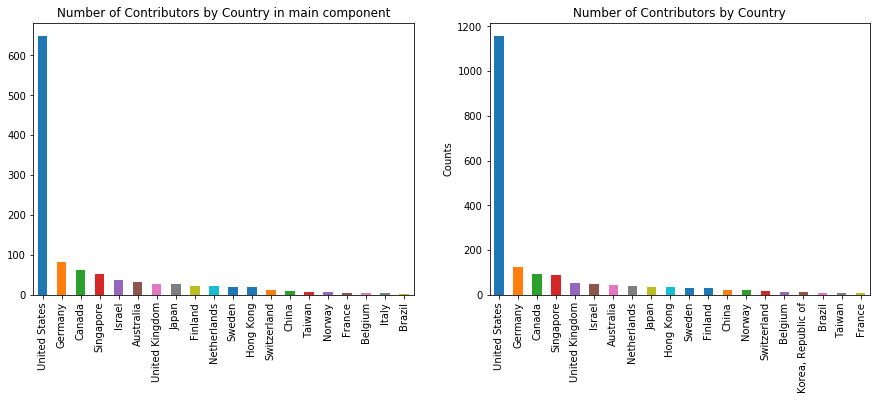

In [48]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.title('Number of Contributors by Country in main component')
main_component.country.value_counts().head(20).plot(kind='bar')
plt.subplot(122)
universities[(~universities.mail.duplicated())].country.value_counts().head(20).plot(kind = 'bar')
plt.title('Number of Contributors by Country') # as determinded by university affiliation
plt.ylabel('Counts')

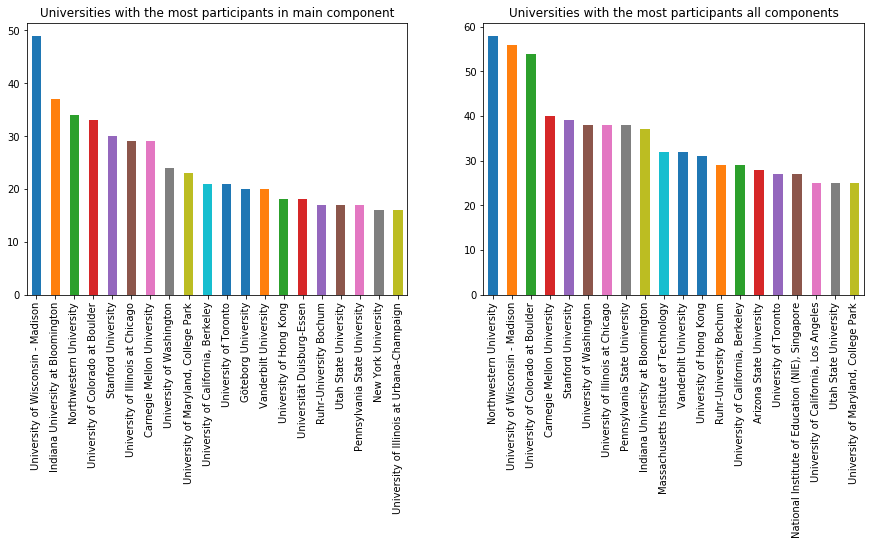

In [49]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
#plt.ylim([0, 60])
plt.title('Universities with the most participants in main component')
main_component.name.value_counts().head(20).plot(kind='bar')
plt.subplot(122)
#plt.ylim([0, 60])
plt.title('Universities with the most participants all components')
universities[(universities.name != 'gmail') & (~universities.mail.duplicated())].name.value_counts().head(20).plot(kind='bar')
plt.show()

## Finding communities in the community: Modularity and Other measures

Constructing the graph with the largest component:

In [50]:
main_component = graph.subgraph(largest_cc)
mapping = nodes.long_name.to_dict()
main_component=nx.relabel_nodes(main_component,mapping)

Here we use modularity to detect communities, which will find subgraph that are unliquely to have developed "randomly".

From wikipedia:

>It was designed to measure the strength of division of a network into modules (also called groups, clusters or communities). Networks with high modularity have dense connections between the nodes within modules but sparse connections between nodes in different modules. Modularity is often used in optimization methods for detecting community structure in networks

In [51]:
c = list(greedy_modularity_communities(main_component))

We find 18 communities in total:

In [52]:
len(c)

29

In [53]:
#smallest community:
min(c, key=len)

frozenset({'Quignard, Matthieu', 'Tchounikine, Pierre', 'Wang, Patrick'})

## clique detection:


Here we look at large groups of researchers that all have collaborated within eachother.
Only look at connections with weight at least 3 -> at least 3 collaborations, froming a clique of at least 7 people.

In [54]:
mc = nx.from_numpy_array(np.where(nx.to_numpy_array(main_component) >= 2, 1, 0))

main_component_ =nx.relabel_nodes(mc, mapping)
large_cliques = [l for l in list(nx.find_cliques(main_component_)) if len(l) > 6]

large_cliques[0]

['Lobczowski, Nikki G.',
 'van Joolingen, Wouter',
 'Xing, Wanli',
 'Shapiro, R. Benjamin',
 'Mann, Michele J.',
 'Quignard, Matthieu',
 'Dorph, Rena',
 'Kluge, Anders',
 'Feraud, Iván Silva']

We get a total of 12 groups:

In [55]:
len(large_cliques)

13

In [56]:
main_component_clique = nx.from_numpy_array(nx.to_numpy_array(main_component))

In [57]:
mc = nx.from_numpy_array(np.where(nx.to_numpy_array(main_component_clique) >=2, 1, 0))

In [58]:
large_cliques = [l for l in list(nx.find_cliques(mc)) if len(l) > 6]
color_cliques = {}
set_inclique = set()
for i, clique in enumerate(large_cliques):
    for member in clique:
        color_cliques[member] = i+1
        set_inclique.add(member)

In [59]:
for member in (set(main_component_clique.nodes)-set_inclique):
    color_cliques[member] = 0

Define colormap for better plotting:

   0  ||  1  ||  2  ||  3  ||  4  ||  5  ||  6  ||  7  ||  8  ||  9  ||  10  ||  11  ||  12


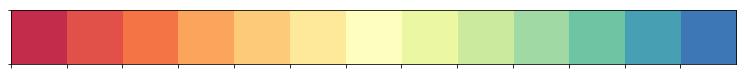

In [60]:
palette = sns.color_palette(palette='Spectral', n_colors=len(large_cliques))

sns.palplot(palette)
print('  ', '  ||  '.join([str(i) for i in list(range(len(large_cliques)))]))

In [61]:
colors = ['#C7C7C7'] + \
    sns.color_palette(palette='Spectral', n_colors=30).as_hex()

In [62]:
node_size = (np.array(list(nx.degree_centrality(main_component_clique).values())))
edge_color= np.array(list(nx.get_edge_attributes(main_component_clique, 'weight').values()))

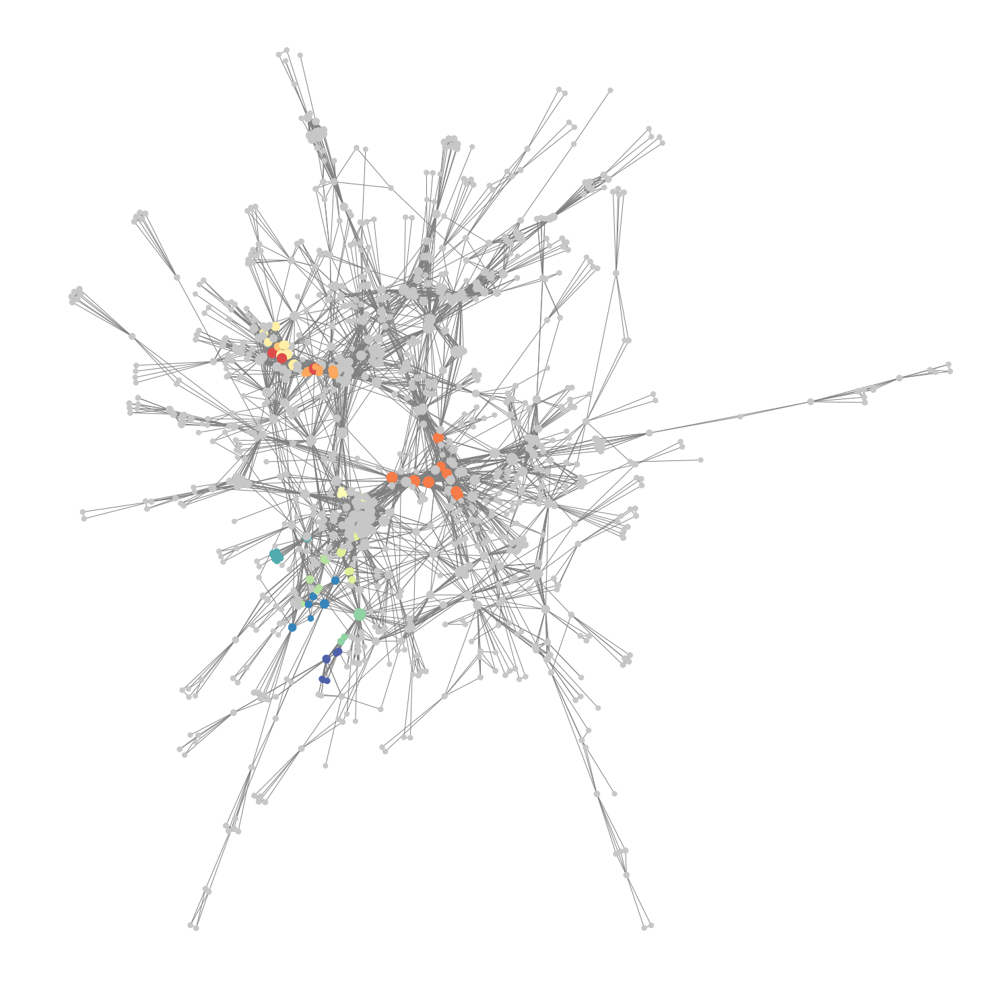

In [63]:
plt.figure(figsize=(20, 20))
nx.draw_spring(main_component_clique, node_color=pd.Series(color_cliques).sort_index().tolist(), 
              cmap=ListedColormap(colors),
              node_size=(node_size+node_size.mean())*5000,
               edge_color='grey',
               iterations=400)

# Using spectral clustering to identify communities:

In [64]:
mapping = nodes.long_name.to_dict()

We change the node size based on degree centrality, the larger the node the more collaborations the individual has:

In [65]:
node_size = np.array(list(nx.betweenness_centrality(main_component).values()))

   1  ||  2  ||  3  ||  4  ||  5  ||  6  ||  7  ||  8  ||  9  ||  10  ||  11  ||  12  ||  13  ||  14  ||  15  ||  16  ||  17  ||  18  ||  19  ||  20  ||  21  ||  22  ||  23  ||  24  ||  25  ||  26


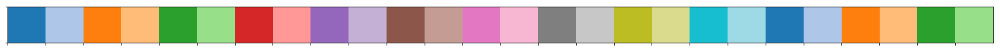

In [66]:
palette = sns.color_palette(palette='tab20', n_colors=26)#len(10)+1)

sns.palplot(palette)
print('  ', '  ||  '.join([str(i) for i in list(range(1, 26+1))]))

In [67]:
n_cluster = 9

In [68]:
from sklearn.cluster import SpectralClustering

# Cluster
sc = SpectralClustering(n_cluster, affinity='precomputed', n_init=100)
sc.fit(nx.adj_matrix(main_component))

# Compare ground-truth and clustering-results
print('spectral clustering')
print(pd.Series(sc.labels_).value_counts())

spectral clustering
5    378
7    373
0    255
8     26
4     25
1     17
6     14
3     13
2     13
dtype: int64


In [69]:
pos = nx.layout.spring_layout(main_component, seed=4)

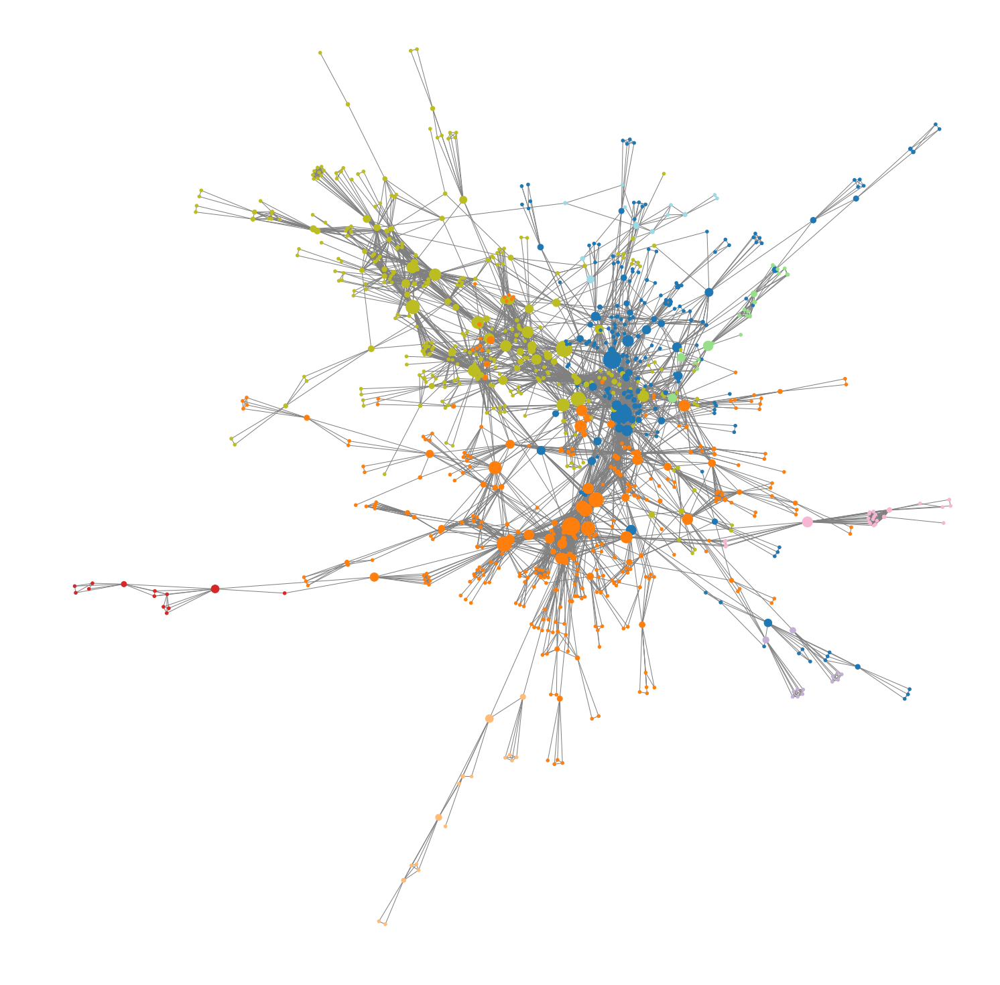

In [70]:
plt.figure(figsize=(20, 20))

nx.draw(main_component,pos=pos, node_color=sc.labels_,#node_color=node_colors, 
                       cmap=ListedColormap(palette.as_hex()),
                       node_size=(node_size+node_size.mean())*6000,
                       #labels=labels,
               edge_color='grey',
              )

In [71]:
from community import community_louvain
partition = community_louvain.best_partition(main_component)
#partition = nx.algorithms.community.greedy_modularity_communities(main_component)
#partition = nx.algorithms.community.asyn_lpa_communities(main_component)

In [72]:
pd.Series(partition).value_counts().shape

(26,)

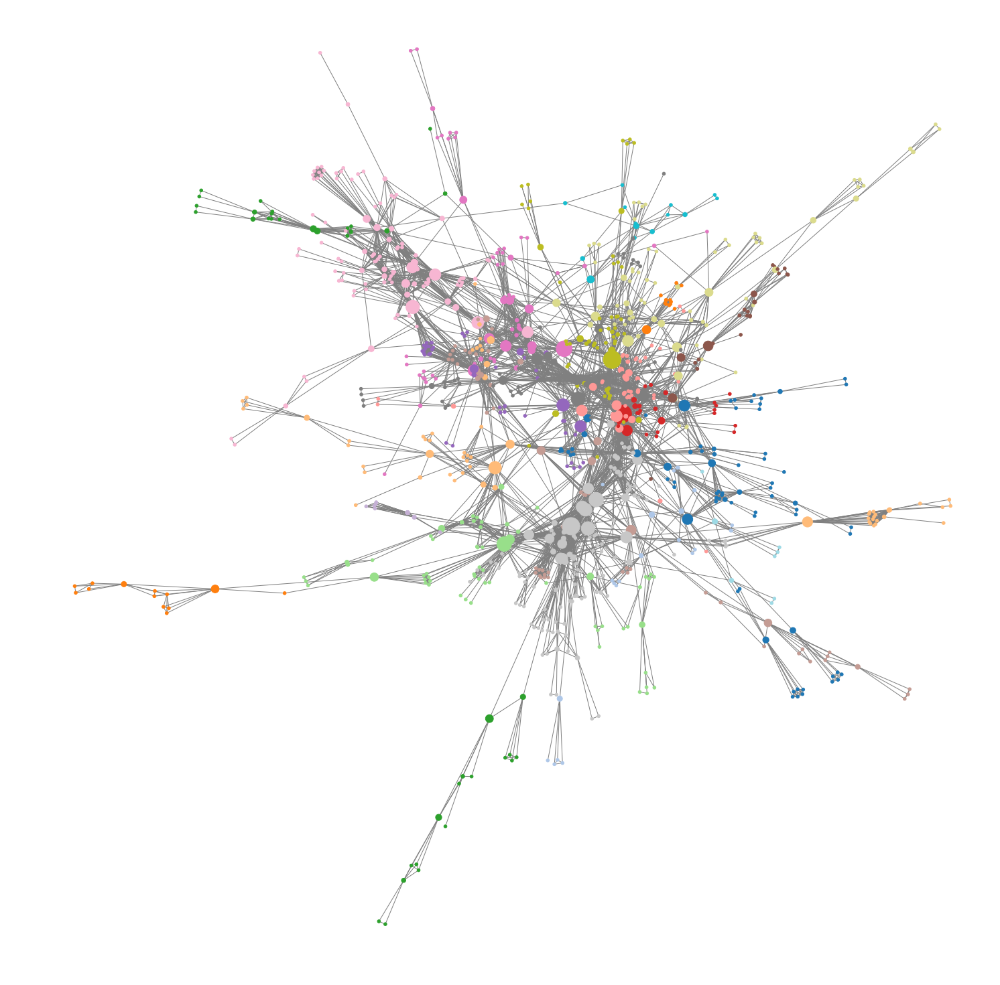

In [73]:
plt.figure(figsize=(20, 20))

nx.draw(main_component, pos=pos, node_color=pd.Series(partition),#node_color=node_colors, 
                       cmap=ListedColormap(palette.as_hex()),
                       node_size=(node_size+node_size.mean())*6000,
                       #labels=labels,
               edge_color='grey',
               iterations=10
              )

plotting this geographically, we see that there is no clear geographical clustering belonging to these commuitues!

### Analyzing each subcomponent

We look at distribution of country and inst. inside these clusters (my it's associated members):

Here we have to code that allows to load this graph in Gephi.

In [74]:
df = pd.DataFrame(list(main_component.nodes), columns=['name'])
df['label'] = sc.labels_
df['size'] = node_size
df.head()

,name,label,size
0,"Swanson, Rebecca D.",7,0.000000
1,"Hinojosa, Leighanna",7,0.000007
2,"Polman, Joseph L",7,0.041340
3,"Huang, Joey",7,0.003243
4,"Gomoll, Andrea Sarah",5,0.008332


In [75]:
c = df.groupby('label').apply(lambda x: set(x['name'].tolist())).tolist()

In [76]:
c = [x for x in c if len(x) > 50]

In [77]:
len(c)

3

As this graph is quite large, we build a smaller graph by cutting off outer nodes, and looking into the connector nodes:

In [78]:
nx.set_node_attributes(main_component, nodes.set_index('long_name').apply(
    lambda x:[x.Lon, x.Lat], axis=1).to_dict(), 'location')

Cluster dist for cluster 1


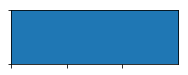

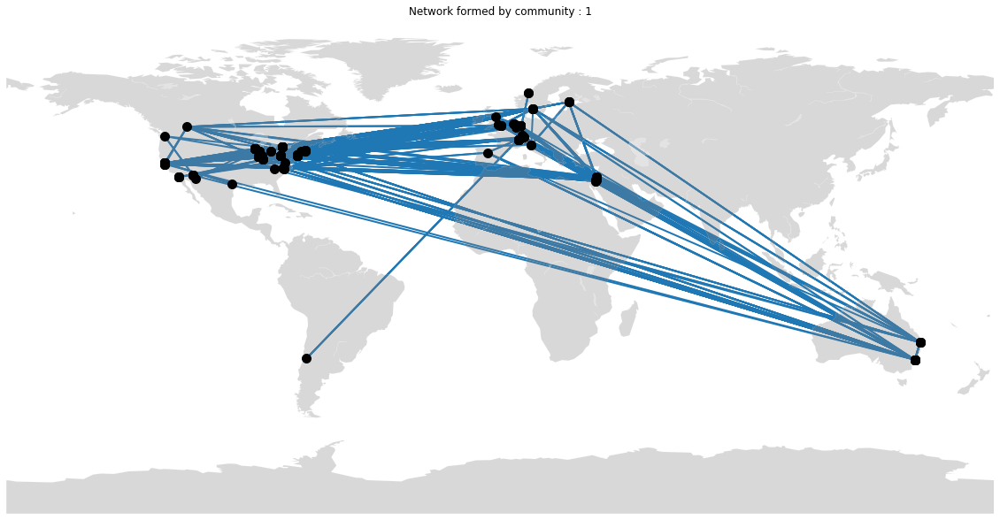

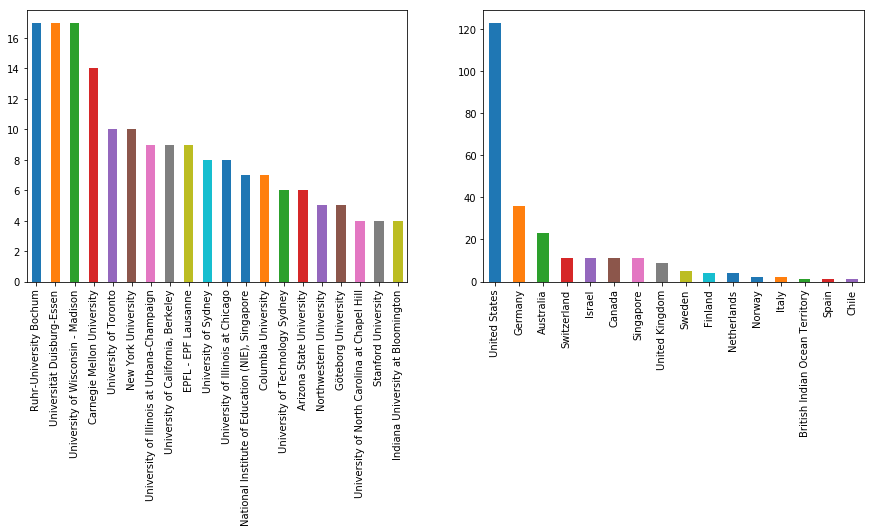

Number of countries in cluster:  16
Number of institutions in cluster:  63
Number of people in cluster:  255


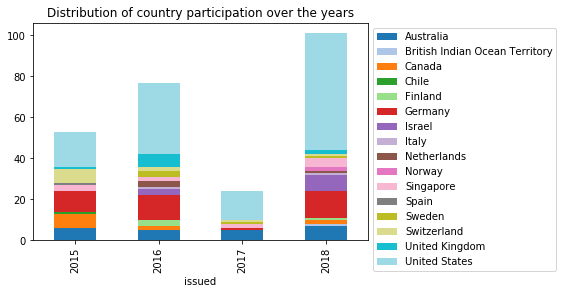

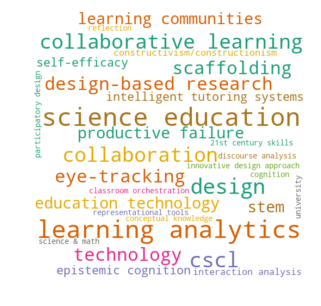

                             centrality
0                                      
Rummel, Nikol                  0.433837
Slotta, James D.               0.214339
Dillenbourg, Pierre            0.178493
Martinez-Maldonado, Roberto    0.139997
Clarke, Sherice                0.104572
Berland, Matthew               0.098783
Rosé, Carolyn Penstein        0.096242
Kali, Yael                     0.080508
Ogan, Amy                      0.080359
Thompson, Kate                 0.079328
Cluster dist for cluster 2


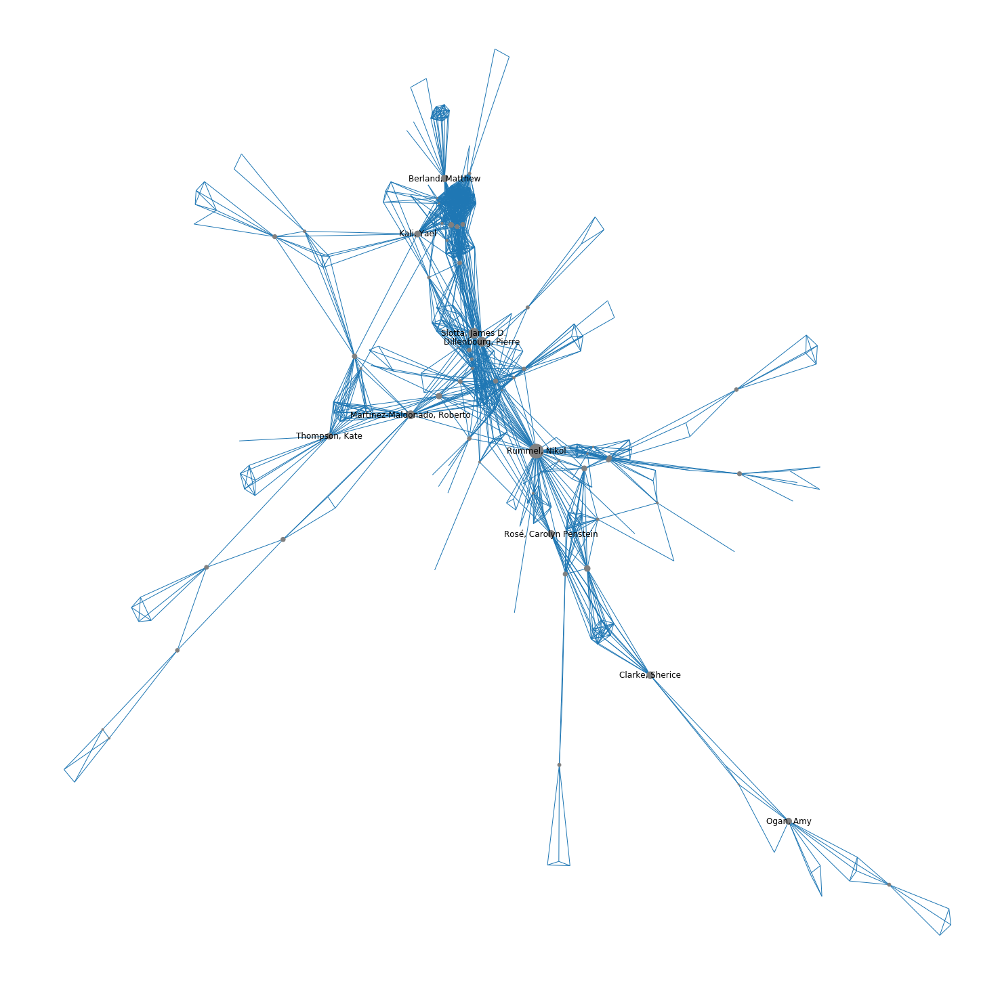

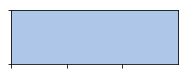

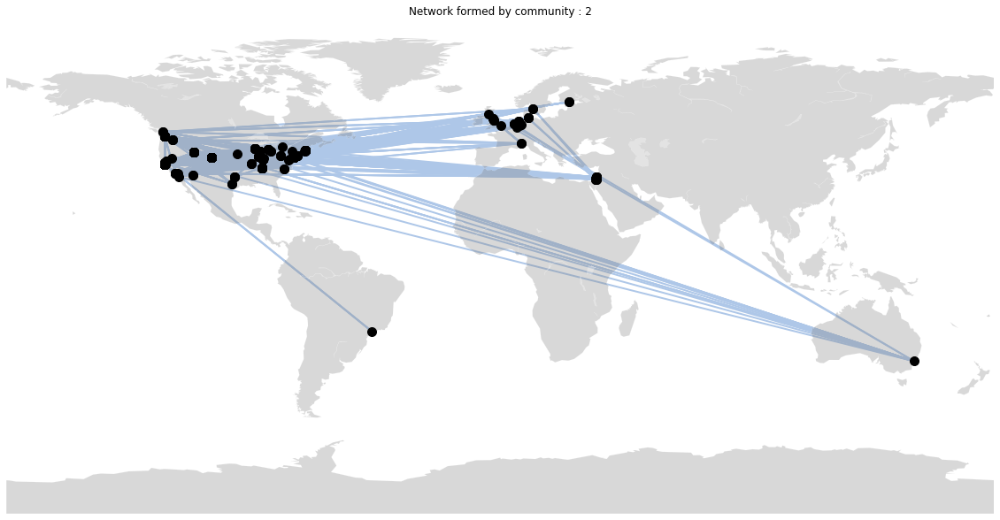

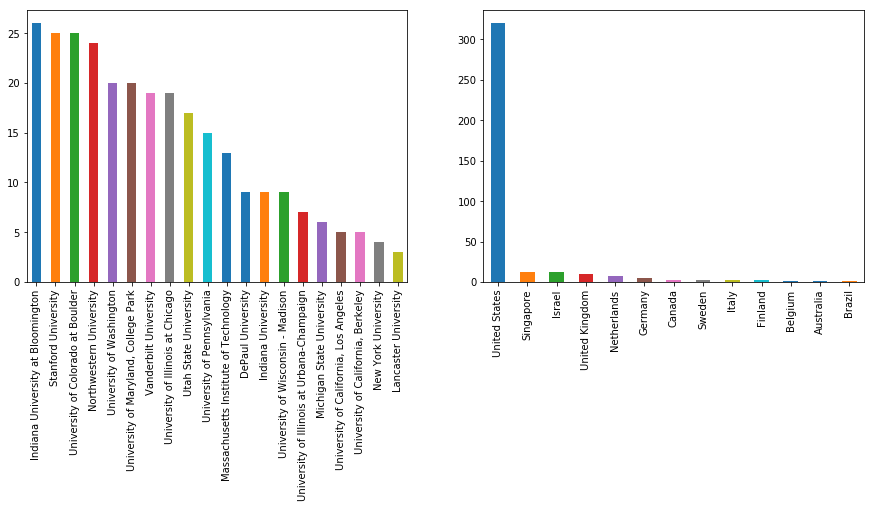

Number of countries in cluster:  13
Number of institutions in cluster:  69
Number of people in cluster:  378


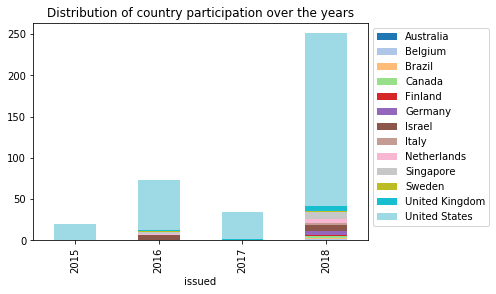

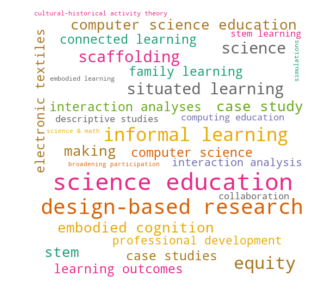

                      centrality
0                               
Penuel, William         0.172419
kafai, yasmin           0.109525
Hall, Rogers            0.104674
Bang, Megan             0.096357
Bell, Philip            0.092900
Danish, Joshua A.       0.080878
Lui, Debora             0.080116
Telhan, Orkan           0.077947
Levy, Sharona T.        0.074881
Shapiro, R. Benjamin    0.073539
Cluster dist for cluster 3


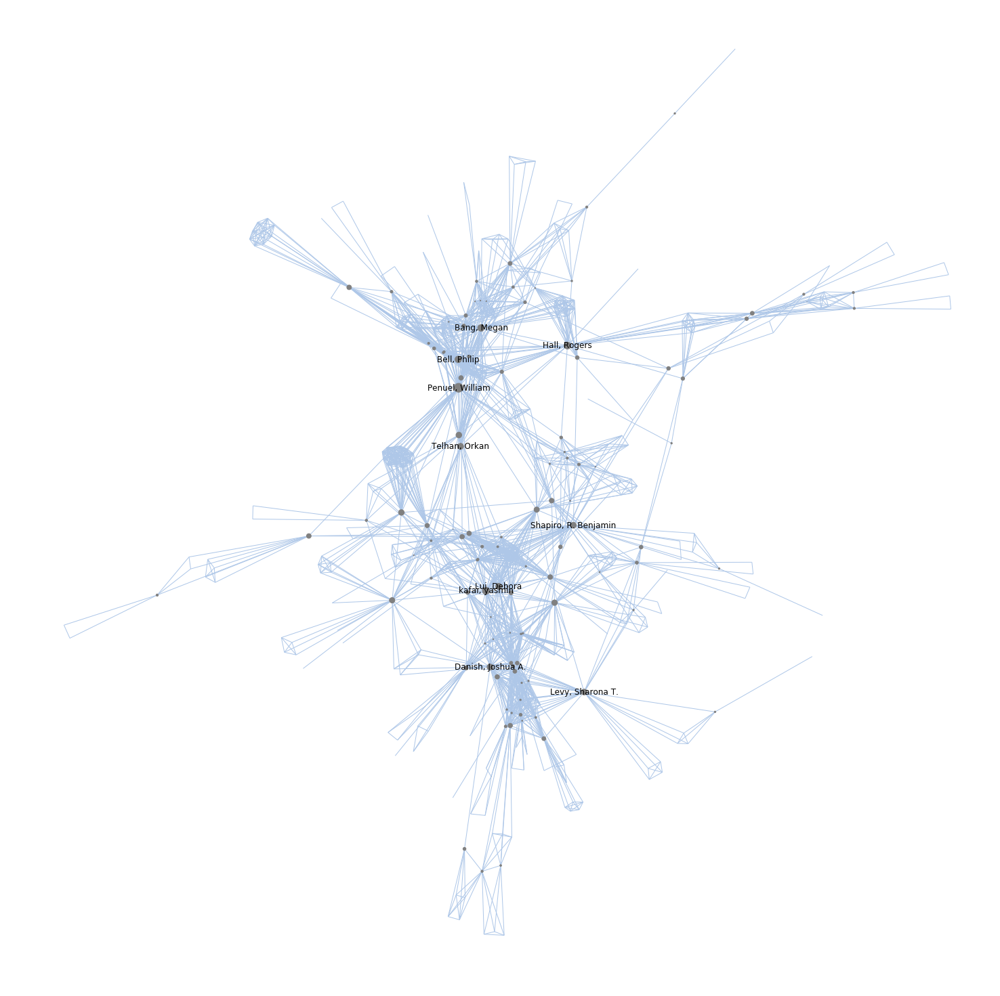

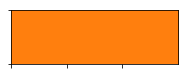

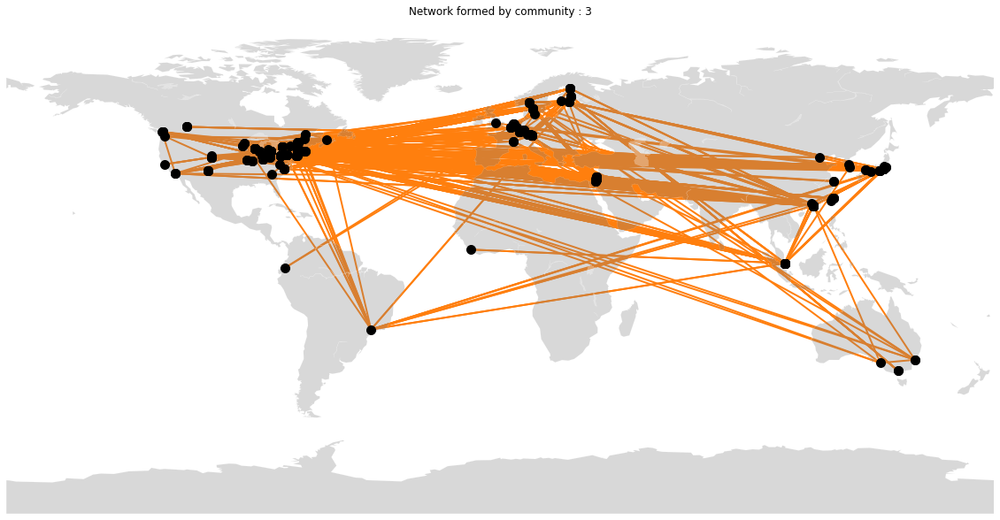

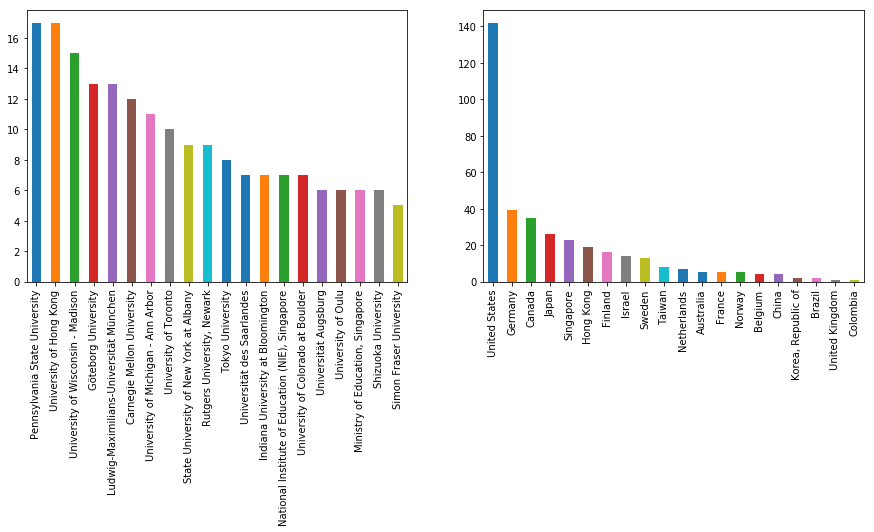

Number of countries in cluster:  22
Number of institutions in cluster:  114
Number of people in cluster:  373


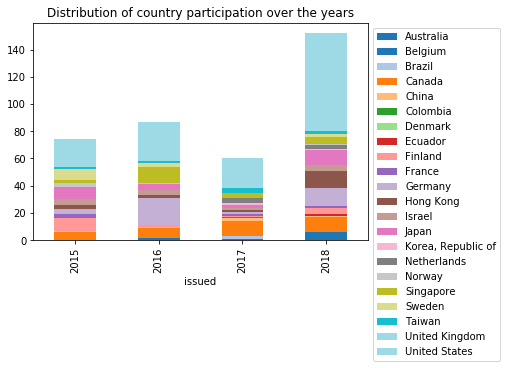

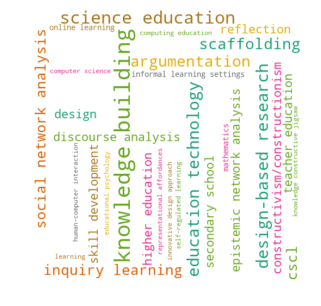

                      centrality
0                               
Fischer, Frank          0.240830
Rosé, Carolyn           0.196086
Polman, Joseph L        0.115000
Kirschner, Paul         0.113273
Hakkarainen, Kai        0.103672
Kollar, Ingo            0.098776
Scardamalia, Marlene    0.096192
Zhang, Jianwei          0.095582
Bielaczyc, Katerine     0.094134
Oshima, Jun             0.091362


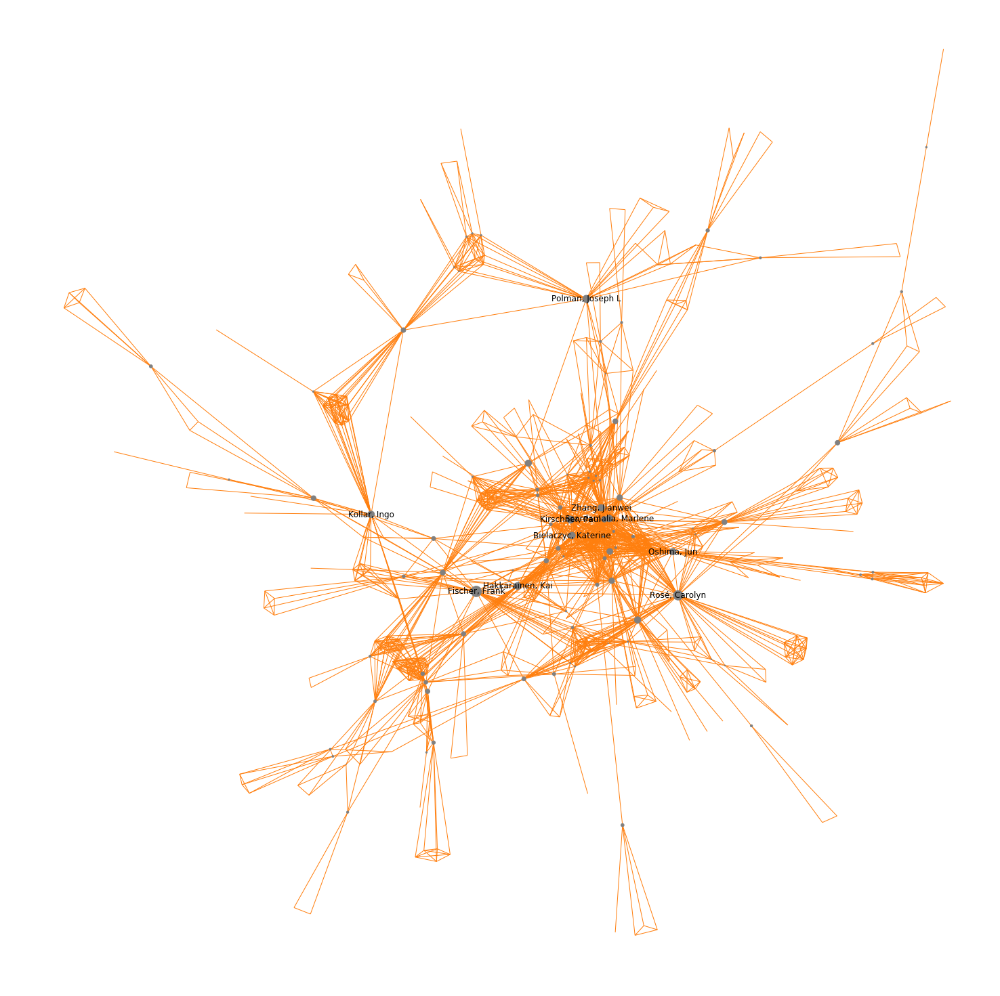

In [79]:
for i,cluster in enumerate(c):
    print(f'Cluster dist for cluster {i+1}')
    sns.palplot(palette[i])
    
    plt.figure(figsize=(20, 20))
    #draw_map_plot(data, palette.as_hex()[i])

    comp = main_component.subgraph(cluster)
    embedding = nx.get_node_attributes(comp, 'location')
        
    m=Basemap()
    m.drawmapboundary(linewidth=0)
    m.fillcontinents(color='grey', alpha=0.3)
    m.drawcoastlines(linewidth=0.1, color="white")
    node_size = 1 #np.array(list(nx.betweenness_centrality(main_component.subgraph(cluster)).values()))
    nx.draw(comp,  
            pos = nx.get_node_attributes(comp, 'location'), 
            node_size= node_size*100,
            edge_color=palette.as_hex()[i],
            node_color='black',
            width = 2)
    
    plt.title('Network formed by community : {}'.format(i+1))
    plt.show()
    
    #adding inner cluster distribution plot
    plt.figure(figsize=(15,5))
    plt.subplot(121)
    nodes[nodes.long_name.isin(cluster)].name.value_counts().head(20).plot('bar')
    plt.subplot(122)
    nodes[nodes.long_name.isin(cluster)].country.value_counts().head(20).plot('bar')
    plt.show()
    
    #getting some concrete values
    print('Number of countries in cluster: ', len(nodes[nodes.long_name.isin(cluster)].country.unique()))
    print('Number of institutions in cluster: ', len(nodes[nodes.long_name.isin(cluster)].name.unique()))
    print('Number of people in cluster: ', len(nodes[nodes.long_name.isin(cluster)].long_name.unique()))
    
    #plt.title('Number of people submitting over the years over the years')
    
   
    plot_df = pd.DataFrame(nodes[nodes.long_name.isin(cluster)].groupby(['issued'])\
                           .country.value_counts()).rename(columns={'country':'count'}).reset_index()
    plot_df.pivot(index='issued', columns='country', values='count').plot(kind='bar', stacked=True, colormap=plt.cm.tab20)
    plt.title('Distribution of country participation over the years')
    plt.legend(bbox_to_anchor=(1, 1))
    
    plt.show()    
    
    keywords = pd.Series(list(nx.get_edge_attributes(comp, 'keywords').values()))
    keywords = pd.Series([i for j in keywords[
        ~keywords.map(lambda x : ''.join(x)).duplicated()].tolist() for i in j]).value_counts()
    
    wordcloud = WordCloud(background_color="white", contour_width=3, width=500, height=500, max_words=30, 
                      min_font_size=1, colormap="Dark2")
    wordcloud.generate_from_frequencies(keywords.to_dict())
    
    plt.figure( figsize=(5,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.savefig('wordcloud.png', bbox_inches='tight')
    plt.show()
    
    
    node_size = np.array(list(nx.betweenness_centrality(comp).values()))
    persons_of_interest = pd.DataFrame(list(comp.nodes)).copy()
    persons_of_interest['centrality'] = node_size

    persons_of_interest.centrality.quantile(.97)

    labels = persons_of_interest.sort_values(by='centrality', ascending=False).head(10)
    print(labels.set_index(0))
    
    layout = nx.drawing.layout.spring_layout(comp, scale=3)
    labels['n']  = labels[0]
    labels = labels.set_index(0).n.to_dict()
    plt.figure(figsize=(20, 20))
    nx.draw(comp, pos=layout,
            node_size=node_size*1000,
            edge_color=palette.as_hex()[i],
            node_color='grey',
            width = 1, labels=labels)

## Looking at people moving around

We now look at people who moved from one country to an other within the period of the papers in the parsed papers:

We have to look at years as well to avoid duplicates, however, this could be due to people being associated to multiple institutions at once.

In [80]:
name_country = associations[['name', 'mail', 'country', 'long_name', 'shortend_names','issued']]

In [81]:
#Add year to see
df = pd.merge(name_country, name_country, on='long_name').dropna()
df = df[df.shortend_names_x == df.shortend_names_y]
df = df[df.country_x != df.country_y]
df = df[df.issued_x <= df.issued_y]
df = df[~df[['long_name','name_x', 'name_y']].duplicated()]
df

,name_x,mail_x,country_x,long_name,shortend_names_x,issued_x,name_y,mail_y,country_y,shortend_names_y,issued_y
538,University of Toronto,jim.slotta@utoronto.ca,Canada,"Slotta, James D.",Slotta J. D.,2015,Boston College,slotta@bc.edu,United States,Slotta J. D.,2017
568,"Ontario Institute for Studies in Education, Un...",jslotta@gmail.com,Canada,"Slotta, James D.",Slotta J. D.,2016,Boston College,slotta@bc.edu,United States,Slotta J. D.,2017
909,Simon Fraser University,afw3@sfu.ca,Canada,"Wise, Alyssa Friend",Wise A. F.,2015,New York University,alyssa.wise@nyu.edu,United States,Wise A. F.,2017
2742,Carnegie Mellon University,ichounta@cs.cmu.edu,United States,"Chounta, Irene-Angelica",Chounta I.,2017,University of Tartu,angeliki.eirini.chounta@ut.ee,Estonia,Chounta I.,2018
3352,Göteborg University,yotamhod24@gmail.com,Sweden,"Hod, Yotam",Hod Y.,2016,University of Haifa,yhod@edu.haifa.ac.il,Israel,Hod Y.,2017
3358,University of Haifa,yhod@edu.haifa.ac.il,Israel,"Hod, Yotam",Hod Y.,2017,Göteborg University,yotamhod24@gmail.com,Sweden,Hod Y.,2018
8095,University of Hong Kong,yqyang@hku.hk,Hong Kong,"Yang, Yuqin",Yang Y.,2015,Central China Normal University,yuqinyang0904@gmail.com,China,Yang Y.,2018
8702,Universität des Saarlandes,a.weinberger@edutech.uni-saarland.de,Germany,"Weinberger, Armin",Tsovaltzi D.,2015,Hebrew University of Jerusalem,asterhan@mail.huji.ac.il,Israel,Tsovaltzi D.,2016
9952,EPFL - EPF Lausanne,kshitij.sharma@epfl.ch,Switzerland,"Sharma, Kshitij",Sharma K.,2015,Norwegian University of Science and Technology,kshitij.sharma@ntnu.no,Norway,Sharma K.,2018
10024,Université de Lausanne,kshitij.kshitij@unil.ch,Switzerland,"Sharma, Kshitij",Sharma K.,2016,Norwegian University of Science and Technology,kshitij.sharma@ntnu.no,Norway,Sharma K.,2018


we can see that within 4 years, a total of 20 repeat participants moved to universities in different countries!

In [82]:
df.long_name.drop_duplicates().shape

(14,)

In [83]:
new_homes = set(df.name_x).union(set(df.name_y))
len(new_homes)

27

In [84]:
len(set(df.name_y))

16

In [85]:
movement_graph = nx.from_pandas_edgelist(df, source='name_x', 
                                         target='name_y', edge_attr=['long_name', 'issued_y'],
                                        create_using=nx.DiGraph)
names = list(movement_graph.nodes)

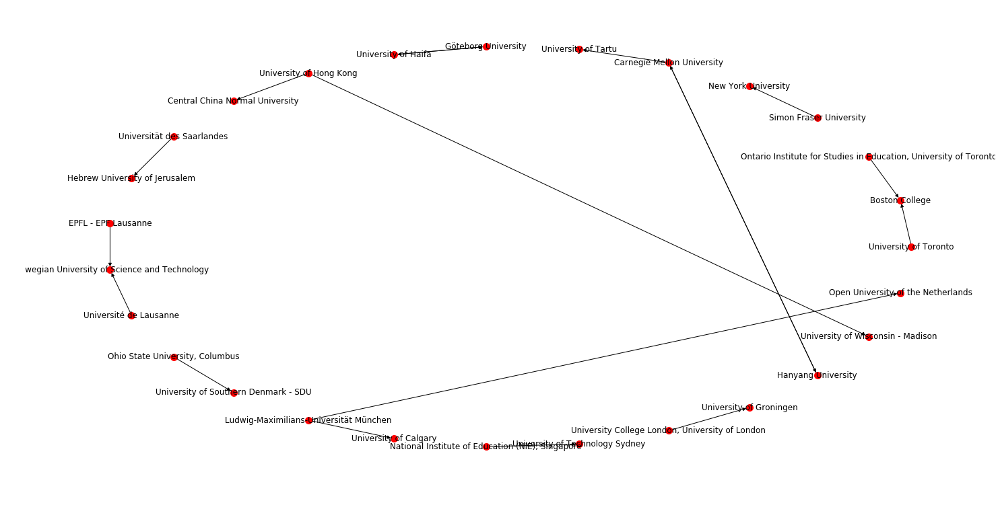

In [86]:
plt.figure(figsize=(20, 10))
nx.draw_circular(movement_graph, node_size=100,
                 labels=pd.DataFrame(names, names).to_dict()[0], 
                )

a total of 70 people change university overall all

In [87]:
#Add year to see
name_country = associations[associations.Lat.notna()][['name', 'mail', 'country', 'long_name', 'shortend_names','issued']]
df = pd.merge(name_country, name_country, on='long_name').dropna()
df = df[df.shortend_names_x == df.shortend_names_y]
df = df[df.name_x != df.name_y]
df = df[df.issued_x <= df.issued_y]
df = df[~df[['long_name','name_x', 'name_y']].duplicated()]
df.long_name.drop_duplicates().shape

(47,)

In [88]:
new_homes = set(df.name_x).union(df.name_y)
len(new_homes)

64

In [89]:
movement_graph = nx.from_pandas_edgelist(df, 
                                         source='name_x', 
                                         target='name_y', 
                                         edge_attr=['long_name', 'issued_y'], 
                                         create_using=nx.DiGraph)


In [90]:
name_loc_mapping = pd.DataFrame(associations[associations.name.isin(new_homes) & ~associations.name.duplicated()].name.copy())

In [91]:
name_loc_mapping['loc'] = associations[associations.name.isin(new_homes) & ~associations.name.duplicated()
                                      ].apply(lambda x: np.array([x.Lon, x.Lat]) , axis=1)

In [92]:
name_loc_mapping = name_loc_mapping.set_index('name')['loc'].to_dict()

In [93]:
nx.set_node_attributes(movement_graph,name_loc_mapping, 'pos')

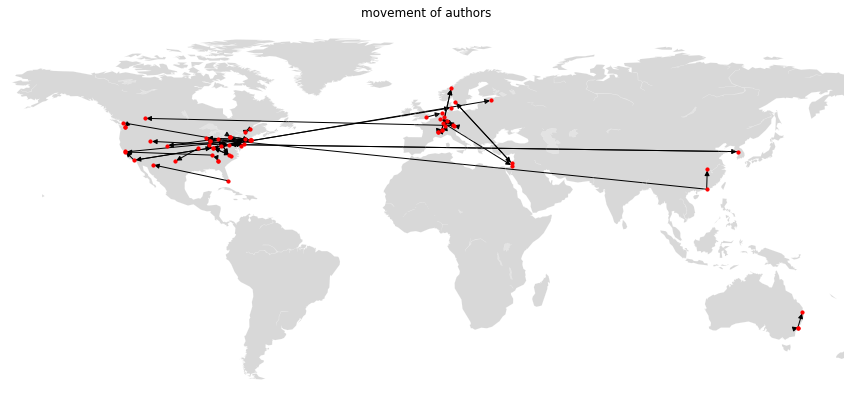

In [94]:
#
names = list(movement_graph.nodes)

plt.figure(figsize=(15, 10))
plt.title('movement of authors')
m=Basemap(llcrnrlon=-170,urcrnrlon=170,llcrnrlat=-60,urcrnrlat=90)
m.drawmapboundary(linewidth=0)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")
nx.draw(movement_graph, node_size=10,
        #labels=pd.DataFrame(names, names).to_dict()[0], 
        pos=nx.get_node_attributes(movement_graph, 'pos'),
        k = 1000)
plt.savefig('figures/movement_map')

## Looking at the network over the years

One interessting observation is that the ICLS years are much more dense and connected.

In [95]:
associations.issued.unique()

array([2018, 2016, 2015, 2017])

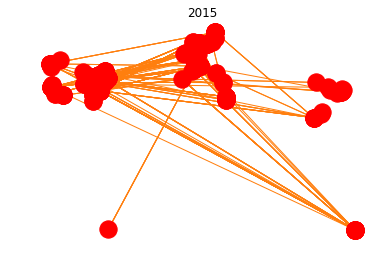

Density of the graph :  0.02270505976994211
The largest component has  58 nodes accounting for 20.49 % of the nodes
The diameter of the largest component is 6
Attribute Assortativity coef: Country:  0.48649233325256996
Attribute Assortativity coef: Uni:  0.3511707243091666


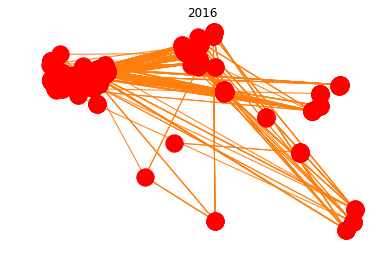

Density of the graph :  0.011852394916911046
The largest component has  102 nodes accounting for 20.56 % of the nodes
The diameter of the largest component is 7
Attribute Assortativity coef: Country:  0.4637766724610206
Attribute Assortativity coef: Uni:  0.37872021832848296


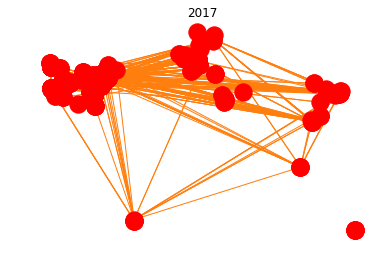

Density of the graph :  0.01720405442215882
The largest component has  80 nodes accounting for 21.39 % of the nodes
The diameter of the largest component is 6
Attribute Assortativity coef: Country:  0.385270486698952
Attribute Assortativity coef: Uni:  0.27652639151951774


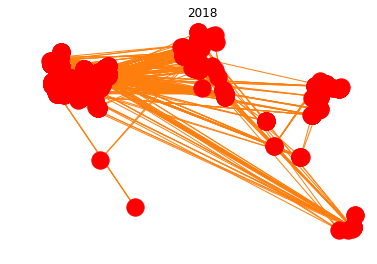

Density of the graph :  0.005488602909720088
The largest component has  411 nodes accounting for 36.57 % of the nodes
The diameter of the largest component is 12
Attribute Assortativity coef: Country:  0.4455344427042158
Attribute Assortativity coef: Uni:  0.3265556100263243


In [96]:
for year in sorted(associations.issued.unique()):

    
    #getting the data in shape to build the graph
    year_assoc = associations[(associations.country.notna()) & (associations.issued==year)]

    self_merge = pd.merge(year_assoc, year_assoc, on='file')
    self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]


    nodes = year_assoc[~year_assoc.long_name.duplicated()].reset_index(drop=True).reset_index()
    name_index = nodes.long_name.to_dict()
    name_index = {v: k for k, v in name_index.items()}

    self_merge['source'] = self_merge.long_name_x.map(name_index)
    self_merge['target'] = self_merge.long_name_y.map(name_index)

    #building the graph
    adjacency = get_adjacency(nodes, self_merge)
    graph = nx.from_numpy_array(adjacency)

    #plot the map
    #plt.figure(figsize=(20, 20))
    plt.title(year)
    data = nodes.copy()
    #draw_map_plot(data, palette.as_hex()[i])


    #add the graph on top
    embedding = nodes.apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw(graph,  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 1)
    plt.show()   
    
    
    #calculate graph theoretical measures
    nx.set_node_attributes(graph, nodes.country.to_dict(), name='country')
    nx.set_node_attributes(graph, nodes.name.to_dict(), name='uni')
    nx.set_node_attributes(graph, nx.degree_centrality(graph), name='centrality')

    print('Density of the graph : ' , nx.density(graph))
    comp = list(nx.connected_components(graph))
    largest_comp = max(comp, key=len)
    percentage_lcc = len(largest_comp)/ graph.number_of_nodes() * 100
    print('The largest component has ',
          len(largest_comp), 'nodes',
          'accounting for %.2f'% percentage_lcc, 
          '% of the nodes')
    lcc = graph.subgraph(largest_comp)
    diameter = nx.diameter(lcc)
    print("The diameter of the largest component is", diameter)
    print('Attribute Assortativity coef: Country: ', nx.attribute_assortativity_coefficient(graph, 'country'))
    print('Attribute Assortativity coef: Uni: ', nx.attribute_assortativity_coefficient(graph, 'uni'))
    

From the above we can deduce that:
1. the community is becomming less tight knit by the year (Density of graph, Diameter, Largest component)
2. something weird is going on in 2017, why is largest commponent so smal
3. There seems to be no string geographical linkage (country/uni) for collaboration (Attribute Assorativity Coefficient), which gives us how likely two nodes are linked given that they have the same attribute (country/uni)

## ICLS vs CSCL:

In [97]:
(associations.issued % 2 == 1).sum()

1088

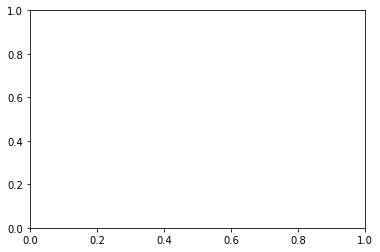

Density of the graph :  0.0047767736721037015
The largest component has  795 nodes accounting for 56.06 % of the nodes
The diameter of the largest component is 14
Attribute Assortativity coef: Country:  0.43803937966125633
Attribute Assortativity coef: Uni:  0.33126527398286115


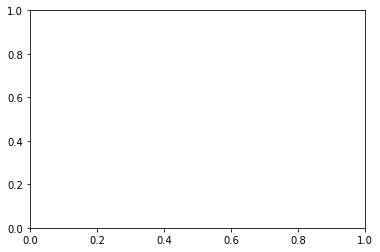

Density of the graph :  0.012173188017390268
The largest component has  152 nodes accounting for 26.21 % of the nodes
The diameter of the largest component is 8
Attribute Assortativity coef: Country:  0.4327244328127936
Attribute Assortativity coef: Uni:  0.30539718020555656


In [98]:
for i, title in enumerate(['ICLS', 'CSCL']):

    year_assoc = associations[(associations.issued % 2 == i)]

    self_merge = pd.merge(year_assoc, year_assoc, on='file')
    self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]

    #edges = self_merge[['long_name_x', 'long_name_y', 'issued_x']].copy()

    nodes = year_assoc[~year_assoc.long_name.duplicated()].reset_index(drop=True).reset_index()
    name_index = nodes.long_name.to_dict()
    name_index = {v: k for k, v in name_index.items()}

    self_merge['source'] = self_merge.long_name_x.map(name_index)
    self_merge['target'] = self_merge.long_name_y.map(name_index)

    adjacency = get_adjacency(nodes, self_merge)
    graph = nx.from_numpy_array(adjacency)

    #plt.figure(figsize=(20, 20))
    #plt.title(title)
    data = nodes.copy()
    #draw_map_plot(data, palette.as_hex()[i])


    embedding = nodes.apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(graph,  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 1)
    plt.show()   

    nx.set_node_attributes(graph, nodes.country.to_dict(), name='country')
    nx.set_node_attributes(graph, nodes.name.to_dict(), name='uni')
    nx.set_node_attributes(graph, nx.degree_centrality(graph), name='centrality')


    print('Density of the graph : ' , nx.density(graph))
    
    
    comp = list(nx.connected_components(graph))
    largest_comp = max(comp, key=len)
    
    percentage_lcc = len(largest_comp)/ graph.number_of_nodes() * 100
    print('The largest component has ',
          len(largest_comp), 'nodes',
          'accounting for %.2f'% percentage_lcc, 
          '% of the nodes')
    
    lcc_quak = graph.subgraph(largest_comp)
    diameter = nx.diameter(lcc_quak)
    print("The diameter of the largest component is", diameter)
    print('Attribute Assortativity coef: Country: ', nx.attribute_assortativity_coefficient(graph, 'country'))
    print('Attribute Assortativity coef: Uni: ', nx.attribute_assortativity_coefficient(graph, 'uni'))
    



From the path length in the largest component we see that the core-cummunity (as given by collaboration) of CSCL seems to be much more close knit than the icls community. Looking at the previous graphs with separation by years this may partially be due to the many new participants in 2018's icls, but as 2016's icls also has a larger diameter, this might be an underlying pattern that could be confirmed with more data.

## Re-examining 2018: how do nodes join?

In [99]:
previous_participation = set(associations[~associations.issued.isin([2018])].long_name.tolist())

year_assoc = associations[(associations.Lon.notna()) & (associations.issued == 2018)].copy()

year_assoc['prev'] = 0
year_assoc.loc[year_assoc.long_name.isin(previous_participation),'prev'] = 1

self_merge = pd.merge(year_assoc, year_assoc, on='file')
self_merge = self_merge[(self_merge.long_name_x != self_merge.long_name_y)]


nodes = year_assoc[~year_assoc.long_name.duplicated()].reset_index(drop=True).reset_index()
nodes = nodes[nodes.Lon.notna()]

name_index = nodes.long_name.to_dict()
name_index = {v: k for k, v in name_index.items()}



self_merge['source'] = self_merge.long_name_x.map(name_index)
self_merge['target'] = self_merge.long_name_y.map(name_index)


adjacency = get_adjacency(nodes, self_merge)
graph = nx.from_numpy_array(adjacency)

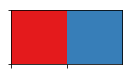

In [100]:
palette = sns.color_palette(palette='Set1', n_colors=2)

sns.palplot(palette)

We see that some of the new nodes joining in 2018 partly attach to people who already have participated in the conference in pervious years, while others join independently.

In red we have ned nodes, blue for old nodes.

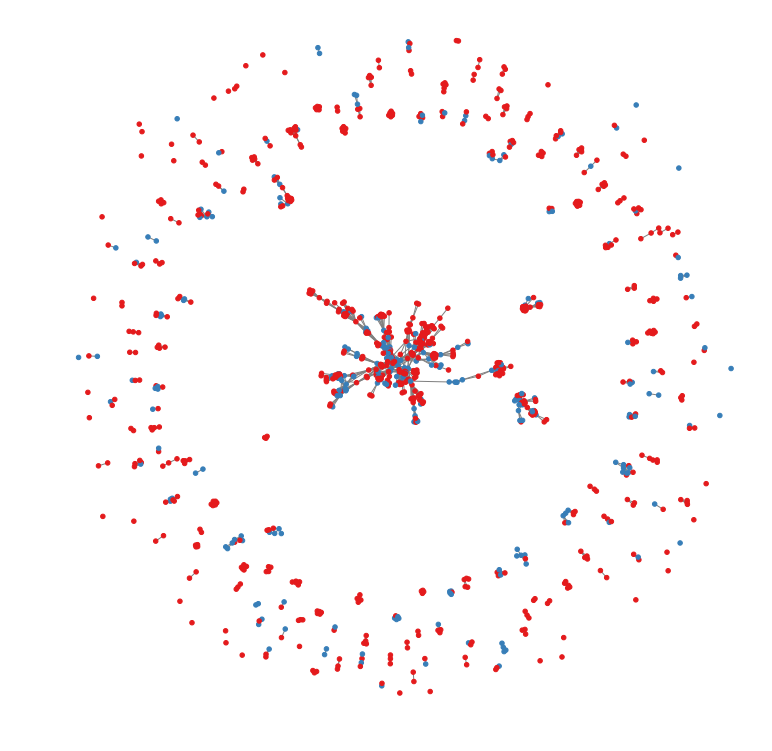

In [101]:
plt.figure(figsize=(10, 10))
nx.draw_spring(graph, cmap=ListedColormap(palette.as_hex()), 
               node_color=nodes.prev.tolist(), width = 1,  edge_color='grey', node_size=[20, 20])

We now analyze these mentors and mentees:

In [102]:
mentoring_connections = self_merge[['long_name_x', 'long_name_y', 'prev_x', 
                                    'prev_y', 'name_x', 'name_y', 'file',
                                   'country_x', 'country_y']]

mentees = mentoring_connections[(mentoring_connections.prev_x != mentoring_connections.prev_y) & 
                      (mentoring_connections.prev_x == 0)]

Number of people that co-authored a paper with somebody who already participated in the conference in previous years:

In [103]:
mentees.long_name_y.drop_duplicates().shape

(230,)

And the institutions they are affiliated with:

In [104]:
mentees[~mentees[['name_y', 'file']].duplicated()].name_y.value_counts().head(10)

Stanford University                  13
University of Hong Kong              12
Indiana University at Bloomington    12
University of Colorado at Boulder    11
University of Wisconsin - Madison    10
Northwestern University               9
Carnegie Mellon University            9
University of Washington              8
New York University                   8
University of Haifa                   7
Name: name_y, dtype: int64

In [105]:
mentees[~mentees[['country_y', 'file']].duplicated()].country_y.value_counts().head(10)

United States     133
Israel             13
Hong Kong          12
Germany            12
Canada              8
United Kingdom      6
Finland             6
Australia           5
Netherlands         5
Japan               5
Name: country_y, dtype: int64

The corresponding mentors:

In [106]:
mentees[~mentees[['long_name_x', 'file']].duplicated()].long_name_x.value_counts().head(10)

Horn, Mike               4
Silver, Cindy Hmelo      4
Moczek, Armin            3
Tu, Xintian              3
Thompson, Naomi          3
Davis, Bria              3
Tolar, Erin              3
Walkington, Candace A    3
Shaw, Mia                3
Sabanovic, Selma         3
Name: long_name_x, dtype: int64

Looking at lone wolf participants:

In [107]:
def get_loners(mentoring_connections):
    loner_mask = (mentoring_connections.groupby('file').prev_x.sum() + mentoring_connections.groupby('file').prev_y.sum())
    loner_mask = loner_mask[loner_mask == 0].index.tolist()
    return mentoring_connections[mentoring_connections.file.isin(loner_mask)]

In [108]:
lone_wolfs = get_loners(mentoring_connections)

In [109]:
lone_wolfs.long_name_y.drop_duplicates().shape

(353,)

In [110]:
lone_wolfs[~lone_wolfs[['long_name_x', 'file']].duplicated()].long_name_x.value_counts().head()

Palincsar, Annemarie Palincsar    3
Brooks, Christopher               3
Betser, Sagit                     3
Fitzgerald, Miranda S             3
Martin, Lee M                     3
Name: long_name_x, dtype: int64

Here comes in the increase of americans in 2018!

In [111]:
lone_wolfs[~lone_wolfs[['name_x', 'file']].duplicated()].name_x.value_counts().head()

University of Michigan - Ann Arbor    6
University of Illinois at Chicago     5
University of Colorado at Boulder     5
Vanderbilt University                 4
Michigan State University             3
Name: name_x, dtype: int64

In [112]:
lone_wolfs[~lone_wolfs[['country_x', 'file']].duplicated()].country_x.value_counts().head(10)

United States         92
Germany                4
United Kingdom         4
Korea, Republic of     3
Canada                 2
Australia              2
Hong Kong              2
Cyprus                 2
Norway                 2
China                  2
Name: country_x, dtype: int64

We should also consider the number of papers, not only the number of participants:

In [113]:
mentees.file.unique().shape

(196,)

In [114]:
lone_wolfs.file.unique().shape

(120,)

In [115]:
mentoring_connections.file.unique().shape

(362,)

The number of papers written uniquely by veterans is then:

In [116]:
mentoring_connections.file.unique().shape[0] - (mentees.file.unique().shape[0]+lone_wolfs.file.unique().shape[0])

46

**We take this idea and apply it to the previous years to get a point of comparisoon:**

#### For 2017

In [117]:
previous_participation = set(associations[~associations.issued.isin([2018, 2017])].long_name.tolist())

year_assoc = associations[(associations.Lon.notna()) & (associations.issued == 2017)].copy()

year_assoc['prev'] = 0
year_assoc.loc[year_assoc.long_name.isin(previous_participation),'prev'] = 1

self_merge = pd.merge(year_assoc, year_assoc, on='file')
self_merge = self_merge[(self_merge.long_name_x != self_merge.long_name_y)]

In [118]:
mentoring_connections = self_merge[['long_name_x', 'long_name_y', 'prev_x', 
                                    'prev_y', 'name_x', 'name_y', 'file',
                                   'country_x', 'country_y']]

mentees = mentoring_connections[(mentoring_connections.prev_x != mentoring_connections.prev_y) & 
                      (mentoring_connections.prev_x == 0)]

Number of people that co-authored a paper with somebody who already participated in the conference in previous years:

In [119]:
mentees.long_name_y.drop_duplicates().shape

(95,)

And the institutions they are affiliated with:

In [120]:
mentees[~mentees[['name_y', 'file']].duplicated()].name_y.value_counts().head(10)

Carnegie Mellon University                5
University of Toronto                     4
University of Pennsylvania                4
Indiana University at Bloomington         4
State University of New York at Albany    4
Pennsylvania State University             4
Shizuoka University                       3
University of Wisconsin - Madison         3
Utah State University                     3
University of Hong Kong                   3
Name: name_y, dtype: int64

In [121]:
mentees[~mentees[['country_y', 'file']].duplicated()].country_y.value_counts().head(10)

United States    33
Germany           6
Canada            4
Japan             4
Switzerland       3
Hong Kong         3
Romania           2
Singapore         2
Finland           1
France            1
Name: country_y, dtype: int64

We see that in 2017, the number of new participants is much more consistend with numbers of incomming phd et. comming into the field.

Again, looking at lone wolf participants:

In [122]:
lone_wolfs = lone_wolfs = get_loners(mentoring_connections)
lone_wolfs.long_name_y.drop_duplicates().shape

(109,)

We also see much fewer lone wolf participants:

In [123]:
lone_wolfs[~lone_wolfs[['name_x', 'file']].duplicated()].name_x.value_counts().head()

University of Wisconsin - Madison                  3
George Mason University                            3
University of Washington                           3
University College London, University of London    3
University of Florida                              2
Name: name_x, dtype: int64

In [124]:
lone_wolfs[~lone_wolfs[['country_x', 'file']].duplicated()].country_x.value_counts().head(10)

United States     28
United Kingdom     4
Canada             3
Sweden             2
Ireland            1
Cyprus             1
China              1
Brazil             1
Germany            1
Name: country_x, dtype: int64

We should also consider the number of papers, not only the number of participants:

In [125]:
mentees.file.unique().shape

(48,)

In [126]:
lone_wolfs.file.unique().shape

(34,)

In [127]:
mentoring_connections.file.unique().shape

(101,)

The number of papers written uniquely by veterans is then:

In [128]:
mentoring_connections.file.unique().shape[0] - (mentees.file.unique().shape[0]+lone_wolfs.file.unique().shape[0])

19

#### For 2016

In [129]:
previous_participation = set(associations[~associations.issued.isin([2018, 2017, 2016])].long_name.tolist())

year_assoc = associations[(associations.Lon.notna()) & (associations.issued == 2016)].copy()

year_assoc['prev'] = 0
year_assoc.loc[year_assoc.long_name.isin(previous_participation),'prev'] = 1

self_merge = pd.merge(year_assoc, year_assoc, on='file')
self_merge = self_merge[(self_merge.long_name_x != self_merge.long_name_y)]

In [130]:
mentoring_connections = self_merge[['long_name_x', 'long_name_y', 'prev_x', 
                                    'prev_y', 'name_x', 'name_y', 'file',
                                   'country_x', 'country_y']]

mentees = mentoring_connections[(mentoring_connections.prev_x != mentoring_connections.prev_y) & 
                      (mentoring_connections.prev_x == 0)]

Number of people that co-authored a paper with somebody who already participated in the conference in previous years:

In [131]:
mentees.long_name_y.drop_duplicates().shape

(68,)

And the institutions they are affiliated with:

In [132]:
mentees[~mentees[['name_y', 'file']].duplicated()].name_y.value_counts().head(10)

University of California, Berkeley                                   6
Ludwig-Maximilians-Universität München                               5
University of Wisconsin - Madison                                    4
EPFL - EPF Lausanne                                                  3
Indiana University at Bloomington                                    3
Universität Augsburg                                                 3
Ruhr-University Bochum                                               3
Göteborg University                                                  2
Ontario Institute for Studies in Education, University of Toronto    2
University of Toronto                                                2
Name: name_y, dtype: int64

In [133]:
mentees[~mentees[['country_y', 'file']].duplicated()].country_y.value_counts().head(10)

United States    26
Germany           9
Canada            4
Switzerland       3
Sweden            2
Israel            2
Australia         2
Hong Kong         1
Taiwan            1
Japan             1
Name: country_y, dtype: int64

We see that in 2017, the number of new participants is much more consistend with numbers of incomming phd et. comming into the field.

Again, looking at lone wolf participants:

In [134]:
lone_wolfs = get_loners(mentoring_connections)
lone_wolfs.long_name_y.drop_duplicates().shape

(229,)

We also see much fewer lone wolf participants:

In [135]:
lone_wolfs[~lone_wolfs[['name_x', 'file']].duplicated()].name_x.value_counts().head()

Columbia University                  6
University of Colorado at Boulder    6
University of New Mexico             3
University of Washington             3
East China Normal University         3
Name: name_x, dtype: int64

In [136]:
lone_wolfs[~lone_wolfs[['country_x', 'file']].duplicated()].country_x.value_counts().head(10)

United States     54
United Kingdom     6
Netherlands        4
Israel             4
Germany            4
Canada             3
Finland            3
China              3
Singapore          3
Sweden             2
Name: country_x, dtype: int64

We should also consider the number of papers, not only the number of participants:

In [137]:
mentees.file.unique().shape

(42,)

In [138]:
lone_wolfs.file.unique().shape

(75,)

In [139]:
mentoring_connections.file.unique().shape

(130,)

The number of papers written uniquely by veterans is then:

In [140]:
mentoring_connections.file.unique().shape[0] - (mentees.file.unique().shape[0]+lone_wolfs.file.unique().shape[0])

13